This notebook logs the processing of images acquired with the OROCHI simulator into units of spectral reflectance, performing channel coalignment by stereo geometric calibration.

The data processed here was captured on the following targets, performed on 28/04/2023:

- Spectralon 99% Calibration
- Geometric Calibration
- Spectralon 5% Validation
- +30° Incidence
    - Sample 1
    - Sample 2
    - Sample 3
    - Sample 4
    - Sample 5
- -30° Incidence
    - Sample 1
    - Sample 2
    - Sample 3
    - Sample 4
    - Sample 5
- Post-Experiment Validation
    - Spectralon 99%
    - Spectralon 5%

In this notebook we have the dual aim of processing and analysing the data, and interogating the data collection method and processing procedures.

# Overview

In this notebook we record the steps of processing images captured by all 7 spectral channels of the OROCHI simulator of 5 bulk rock samples to units of reflectance.

Images were captured of the sample under illumination from incidence angles of + and - 30° (i.e. from the right and left sides of the sample), to check for dependencies of reflectance on camera placement with respect to the sample. We also captured images of the dark (~5% reflectance) spectralon calirbation target, and repeat measurements of the light (~99% reflectance) spectralon target, for validation.

The steps of processing are:
1. Spectralon 99% Reflectance Calibration:
    - Load, average and bias correct Spectralon Calibration Target images
    - Correct for exposure
    - Load reference reflectance of spectralon 99% for each channel
    - Find reflectance calibration coefficient for each pixel
    - Mask dark pixels around the Calibration Target
2. Geometric Calibration
    - Load, average and bias correct Geometric Calibration target images
    - For each pairing of the 550 nm base channel, find the homography matrix
3. Sample Reflectance Calibration and Coalignment
    - *For each sample, and for each incident angle, and for the spectralon 5% target:*
    - Load, average and bias correct Sample images
    - Correct for exposure
    - Apply calibration coefficient frames
    - Mask for Calibration Target area and Sample area.
    - Apply geometric coalignment    
3. Sample Reflectance Plotting:
    - *For each sample*
    - Chose 3 Regions of Interest (manual)
    - Extract mean and standard deviation of reflectance, and mean error
    - plot reflectance and error sources
    - overplot same data from other incidence angle
    - repeat for normalised data
    - Save view of regions of interest
    - save data

# Setup

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import orochi_sim_proc as osp

# Spectralon 99% Reflectance Calibration

First we process images of the 99% reflectance spectralon target. To capture the spatial nonuniformity of the sample area illumination, we process a reflectance calibration coefficient for each pixel.
This process therefore has the dual effect of correcting for both instrument and illuminant nonuniformity.

However, it also inherently captures the spectralon target surface reflectance nonuniformity, which is of course independent of the illumination and instrument response.

We will consider the effects of including this nonuniformity in the image processing chain, and we will consider methods to mitigate the effect (e.g. by Gaussian blurring out fine grain nonuniformities.)

For each channel, we first load, average and bias correct the Spectralon Calibration Target images.

## Image Loading Procedure

For every image sequence we captured $N=10$ lit images, $S_i$, and $N=10$ dark images, $D_i$. When loading images, we compute the averages and standard deviations of the lit and dark images, and subtract, to give the above-bias signal mean image, $\bar{S}_{\mu}$, for each channel:

$S_{\mu} = \frac{\sum{S_i}}{N}$, 
$S_{\sigma} = \sqrt{\frac{\sum{(S_{i} - S_{\mu})^2}}{N}}$

$D_{\mu} = \frac{\sum{D_i}}{N}$,
$D_{\sigma} = \sqrt{\frac{\sum{(D_{i} - D_{\mu})^2}}{N}}$

$\bar{S}_{\mu} = S_{\mu} - D_{\mu}$

and we also compute the uncertainty over the repeat images, by computing the standard deviation image $\bar{S}_{\sigma}$:

$\bar{S}_{\sigma} = \bar{S}_{\mu} \sqrt{\frac{S_{\sigma}}{S_{\mu}}^2 + \frac{D_{\sigma}}{D_{\mu}}^2}$

Loaded images (img) for: 0 (650 nm)
Loaded images (drk) for: 0 (650 nm)
Subtracting dark frame for: 0 (650 nm)
Loaded images (img) for: 1 (475 nm)
Loaded images (drk) for: 1 (475 nm)
Subtracting dark frame for: 1 (475 nm)
Loaded images (img) for: 3 (400 nm)
Loaded images (drk) for: 3 (400 nm)
Subtracting dark frame for: 3 (400 nm)
Loaded images (img) for: 4 (725 nm)
Loaded images (drk) for: 4 (725 nm)
Subtracting dark frame for: 4 (725 nm)
Loaded images (img) for: 5 (850 nm)
Loaded images (drk) for: 5 (850 nm)
Subtracting dark frame for: 5 (850 nm)
Loaded images (img) for: 6 (550 nm)
Loaded images (drk) for: 6 (550 nm)
Subtracting dark frame for: 6 (550 nm)
Loaded images (img) for: 7 (950 nm)
Loaded images (drk) for: 7 (950 nm)
Subtracting dark frame for: 7 (950 nm)


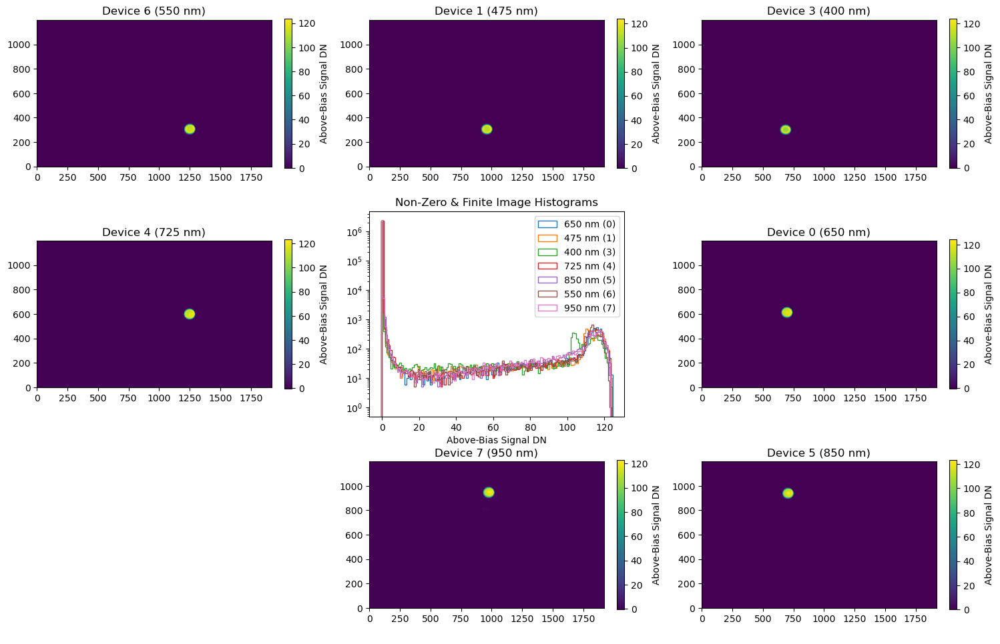

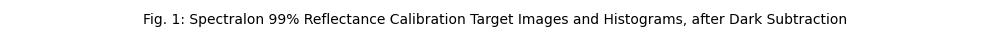

In [3]:
caption = f'Fig. {1}: Spectralon 99% Reflectance Calibration Target Images and Histograms, after Dark Subtraction'
cali_imgs = osp.load_reflectance_calibration('reflectance_calibration', caption=caption)

Here we see the placement of the spectralon target in the field of each channel, and we see the histogram of each image (after dark frame subtraction).

This shows that all channels have an approximately equal distribution, with the exception of the 400 nm (device 3) channel, that has a small bimodality.

We can investigate more closely by showing each channel over the respective region of interest:

Loaded images (img) for: 0 (650 nm)
Loaded images (drk) for: 0 (650 nm)
Subtracting dark frame for: 0 (650 nm)
Loaded images (img) for: 1 (475 nm)
Loaded images (drk) for: 1 (475 nm)
Subtracting dark frame for: 1 (475 nm)
Loaded images (img) for: 3 (400 nm)
Loaded images (drk) for: 3 (400 nm)
Subtracting dark frame for: 3 (400 nm)
Loaded images (img) for: 4 (725 nm)
Loaded images (drk) for: 4 (725 nm)
Subtracting dark frame for: 4 (725 nm)
Loaded images (img) for: 5 (850 nm)
Loaded images (drk) for: 5 (850 nm)
Subtracting dark frame for: 5 (850 nm)
Loaded images (img) for: 6 (550 nm)
Loaded images (drk) for: 6 (550 nm)
Subtracting dark frame for: 6 (550 nm)
Loaded images (img) for: 7 (950 nm)
Loaded images (drk) for: 7 (950 nm)
Subtracting dark frame for: 7 (950 nm)


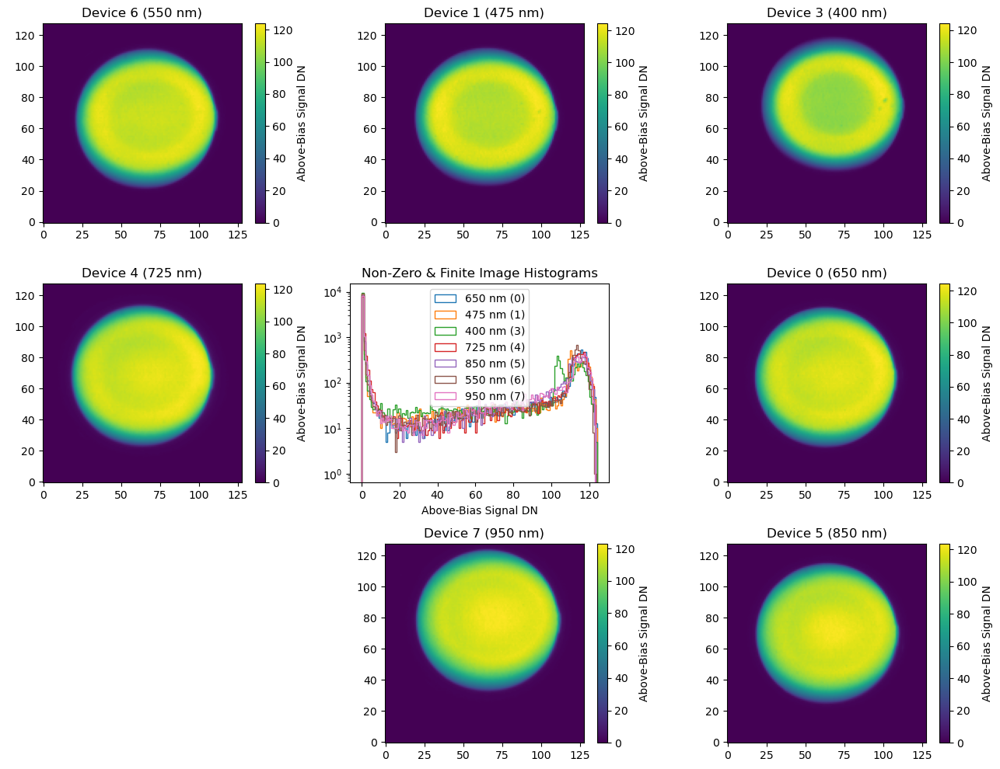

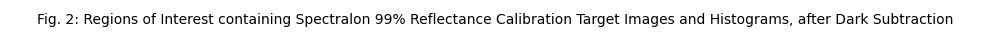

In [4]:
caption = f'Fig. {2}: Regions of Interest containing Spectralon 99% Reflectance Calibration Target Images and Histograms, after Dark Subtraction'
cali_imgs = osp.load_reflectance_calibration('reflectance_calibration', roi=True, caption=caption)

Indeed we see a ring structure emerge in the 400 nm channel.

This is corrected for with the method of finding the calibration coefficient for each individual pixel.

Note also that the pattern is low-frequency, and thus we would expect blurring of the image to preserve this nonuniformity. This might be performed in order to remove high-frequency spatial nonuniformities, that may be inherent to the spectral surface reflectance.

We now find the calibration coefficients, through the following steps:
- Correct for exposure
- Load reference reflectance of spectralon 99% for each channel
- Find reflectance calibration coefficient for each pixel
- Mask dark pixels around the Calibration Target

## Reflectance Coefficient Computation

To compute the refletance calibration coefficients, in units of 1/DN/s, for each pixel of each channel, we simply divide the reference reflectance of the calibration target (provided by the manufacturer), averaged over the channel bandwidth, by the image flux (DN/s). 

For each channel, we comptue the flux as

$F_{\mu} = \bar{S}_{\mu} / t_{exp}$

and assuming the exposure uncertainty is negligible, we give the uncertainty simply as:

$F_{\sigma} = \bar{S}_{\sigma} / t_{exp}$

We then calculate the reference reflectance of the given channel according to the channel transmission, characterised by central wavelength $\lambda_c$ and bandwidth $\Delta\lambda$:

$R'_{\mu} = \frac{1}{\Delta\lambda}\sum_{\lambda_{c}-\Delta\lambda/2}^{\lambda_{c}+\Delta\lambda/2}{R_{ref}(\lambda)}$

with uncertainty

$R'_{\sigma} = \frac{1}{\Delta\lambda}\sum_{\lambda_{c}-\Delta\lambda/2}^{\lambda_{c}+\Delta\lambda/2}{(R_{ref}(\lambda) - R'_{\mu})^2}$

and then find the reflectance calibration coefficient image $\Gamma_{\mu}$ as:

$\Gamma_{\mu} = R'_{\mu} / F_{\mu}$

with uncertainty

$\Gamma_{\sigma} = \Gamma_{\mu} \sqrt{ \frac{F_{\sigma}}{F_{\mu}}^2 + \frac{R'_{\sigma}}{R'_{\mu}}^2 }$

Finding Reflectance Correction for: 0 (650 nm)
Finding Reflectance Correction for: 1 (475 nm)
Finding Reflectance Correction for: 3 (400 nm)
Finding Reflectance Correction for: 4 (725 nm)
Finding Reflectance Correction for: 5 (850 nm)
Finding Reflectance Correction for: 6 (550 nm)
Finding Reflectance Correction for: 7 (950 nm)


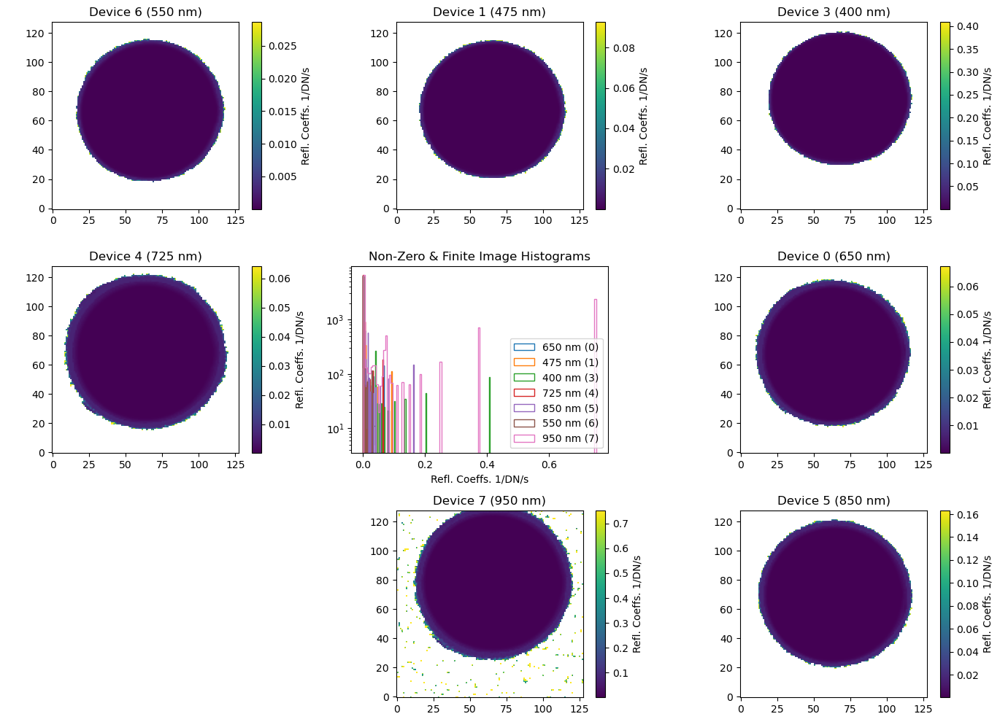

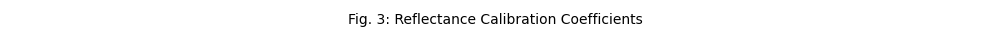

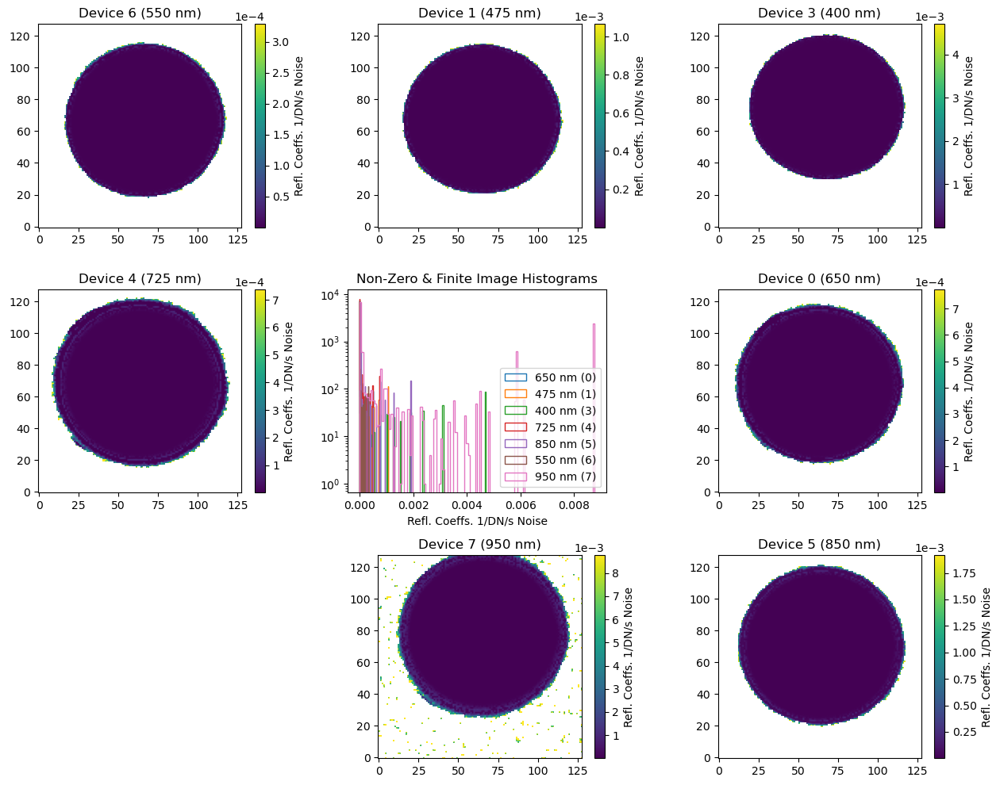

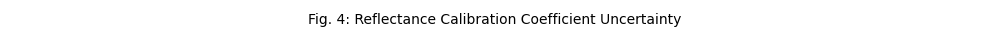

In [5]:
caption = (
    f'Fig. {3}: Reflectance Calibration Coefficients',
    f'Fig. {4}: Reflectance Calibration Coefficient Uncertainty'
)
cali_coeffs = osp.calibrate_reflectance(cali_imgs, clip=0.0, caption=caption)

### Discarding Dark Pixels of the Spectralon Reflectance Target

By considering the histograms we can see that each target has a long-tailed distribution (note the logarithmic y-axis).

This is due to darkening of the illumination at the edges of the target, that result in high reciprocals - i.e. reflectance calibration coefficients.

These bright edges are shown in the individual channel image regions of interest.

These edge regions should be avoided during sample processing.

We can enforce that at this stage by applying a mask that discards pixels lower than the 73rd percentile.

Note that when setting to the rounder 75th percentile, we found a number of interior pixels were discarded in some channels, implying the clipping criteria was too stringent. Relaxing to the 73rd percentile retains interior pixels, but leaves a small increase at the disc edge.

Finding Reflectance Correction for: 0 (650 nm)
Exposure already corrected.
Finding Reflectance Correction for: 1 (475 nm)
Exposure already corrected.
Finding Reflectance Correction for: 3 (400 nm)
Exposure already corrected.
Finding Reflectance Correction for: 4 (725 nm)
Exposure already corrected.
Finding Reflectance Correction for: 5 (850 nm)
Exposure already corrected.
Finding Reflectance Correction for: 6 (550 nm)
Exposure already corrected.
Finding Reflectance Correction for: 7 (950 nm)
Exposure already corrected.


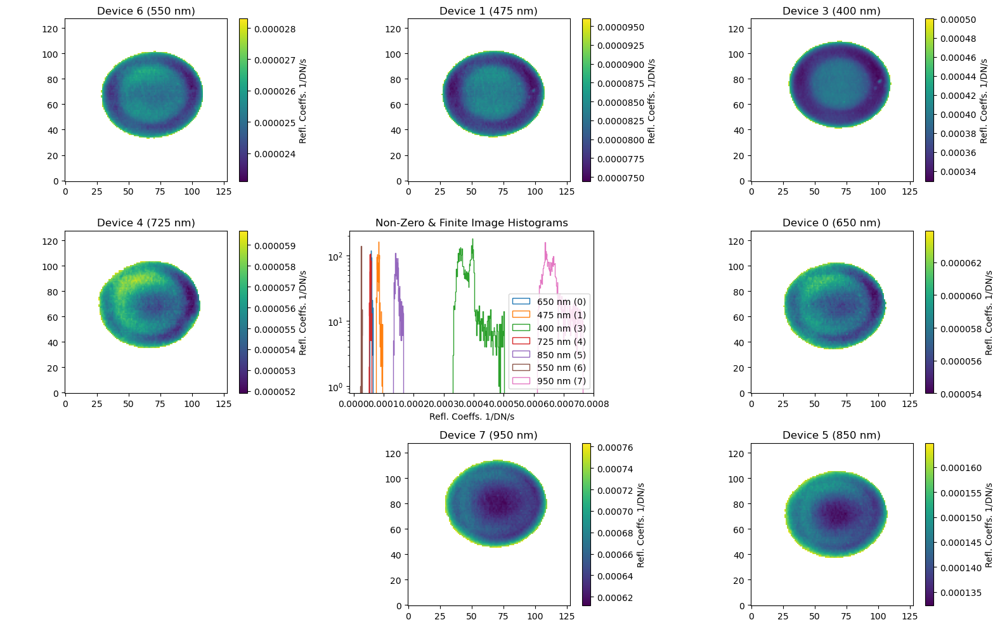

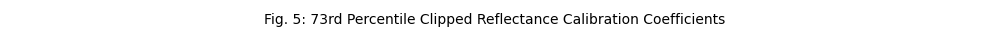

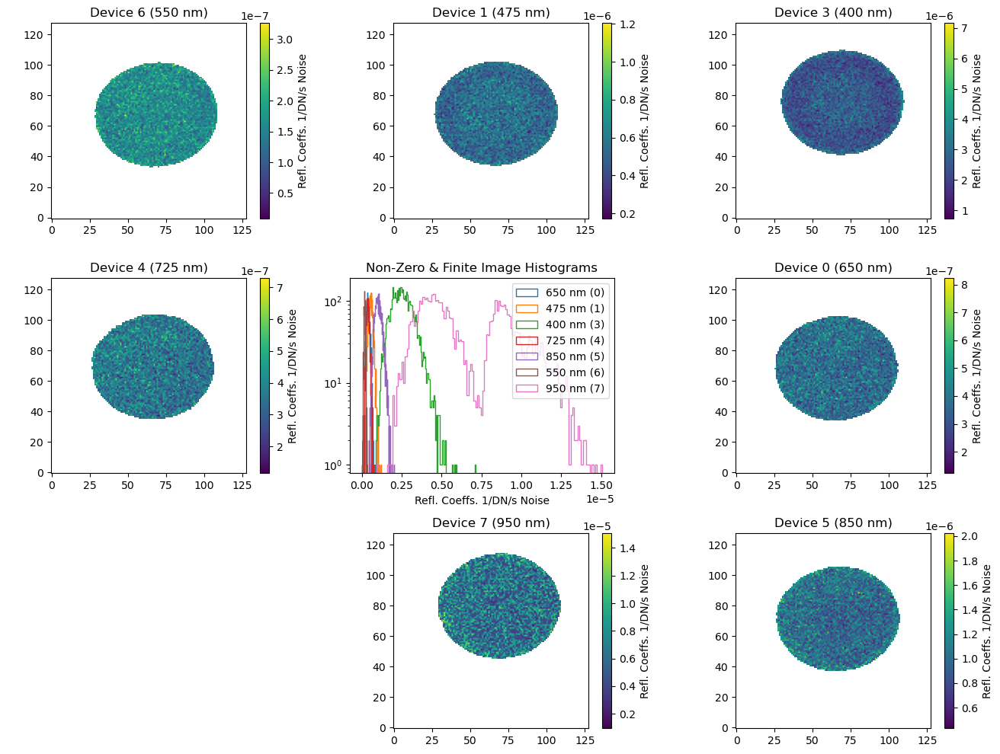

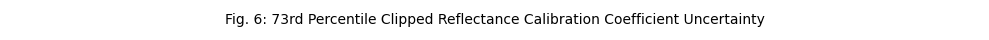

In [6]:
caption = (
    f'Fig. {5}: 73rd Percentile Clipped Reflectance Calibration Coefficients',
    f'Fig. {6}: 73rd Percentile Clipped Reflectance Calibration Coefficient Uncertainty'
)
cali_coeffs = osp.calibrate_reflectance(cali_imgs, clip=0.73, caption=caption)

Now we see well defined histograms for each channel, although these mostly still exhibit a small amount of positive skew.

We also present the uncertainty propagated for each pixel, showing an approximatley uniform spatial distribution, with the exception of the 950 nm channel that appears to have a bimodal noise distribution. 

As the 950 nm channel has the lowest sensitivity, and we expect the illumination source to be weakest in this spectral region, we can hypothesise that the 950 nm channel uses a longer exposure time, and thus has a stronger dark signal component than the other channels, causing this bimodality in the noise distribution.

We can check the dark signal and dark signal nonuniformity images:

Loaded images (drk) for: 0 (650 nm)
Loading reflectance_calibration: 0 (650 nm)
Loaded images (drk) for: 1 (475 nm)
Loading reflectance_calibration: 1 (475 nm)
Loaded images (drk) for: 3 (400 nm)
Loading reflectance_calibration: 3 (400 nm)
Loaded images (drk) for: 4 (725 nm)
Loading reflectance_calibration: 4 (725 nm)
Loaded images (drk) for: 5 (850 nm)
Loading reflectance_calibration: 5 (850 nm)
Loaded images (drk) for: 6 (550 nm)
Loading reflectance_calibration: 6 (550 nm)
Loaded images (drk) for: 7 (950 nm)
Loading reflectance_calibration: 7 (950 nm)


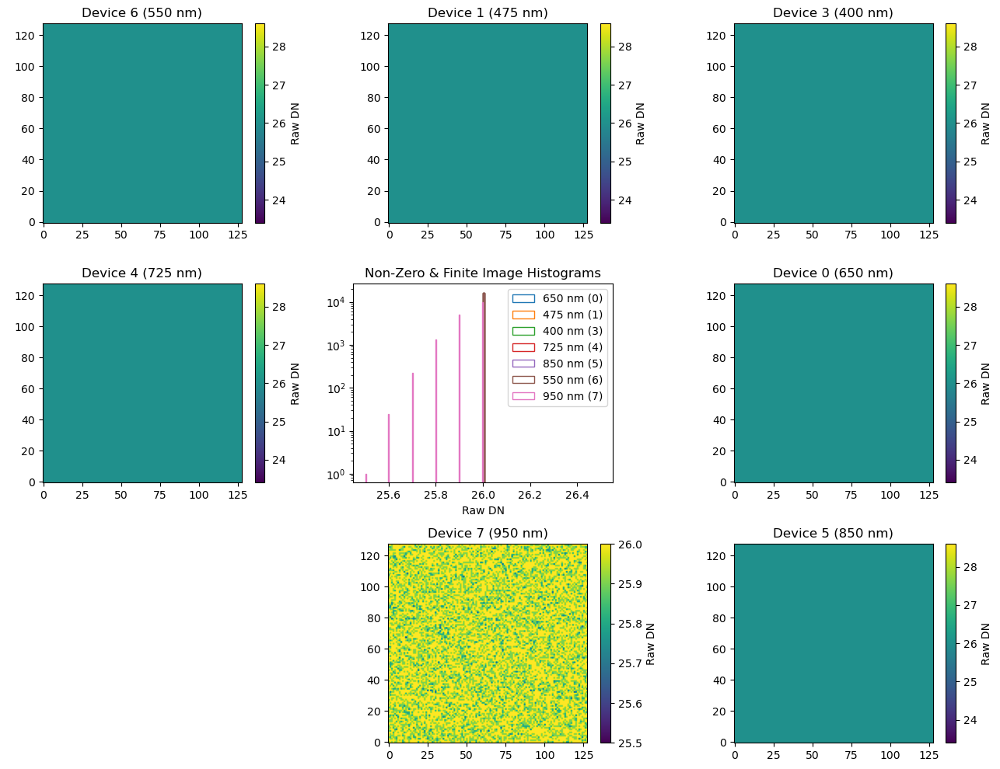

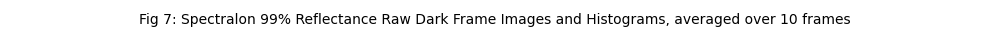

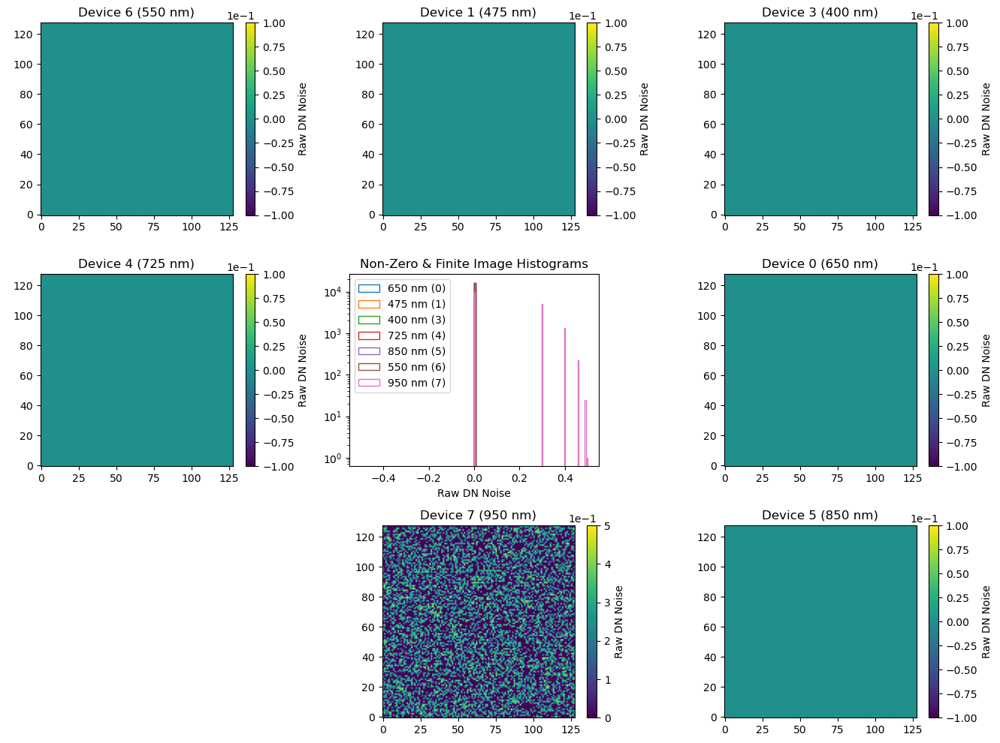

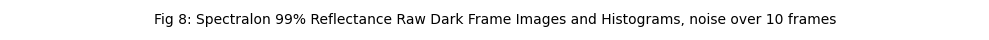

In [7]:
caption = (
    f'Fig {7}: Spectralon 99% Reflectance Raw Dark Frame Images and Histograms, averaged over 10 frames',
    f'Fig {8}: Spectralon 99% Reflectance Raw Dark Frame Images and Histograms, noise over 10 frames'
)
dark_smpl_imgs = osp.load_dark_frames('reflectance_calibration', roi=True, caption=caption)

Indeed we see that the 950 nm channel is the only with a perceiveble noise contribution. Checking the exposure times of the channels, we also see that this channel uses the longest exposure, of 76 ms.

In [8]:
osp.get_exposures(dark_smpl_imgs)

0_650    0.006812
1_475    0.009384
3_400    0.041476
4_725    0.006498
5_850    0.016553
6_550    0.002900
7_950    0.076067
dtype: float64

To keep uniformity across all imaging channels, we may switch the illumination source to give a brighter signal in this region of the infrared, in order to reduce the required exposure time for this camera channel.

# Geometric Calibration

We perform rudimentary geometric calibration by processing images of a small checkerboard target, printed on paper and afixed to the cap of the spectralon target. This provides well defined features for each channel to recognise, and to then find the homography matrix for transforming the image channels to be co-aligned.

We load the images of the geometric calibration target following the previous method, and calibrate the homography matrices.

Loaded images (img) for: 0 (650 nm)
Loading Geometric Target for: 0 (650.0 nm)
Loaded images (drk) for: 0 (650 nm)
Subtracting dark frame for: 0 (650 nm)
Loaded images (img) for: 1 (475 nm)
Loading Geometric Target for: 1 (475.0 nm)
Loaded images (drk) for: 1 (475 nm)
Subtracting dark frame for: 1 (475 nm)
Loaded images (img) for: 3 (400 nm)
Loading Geometric Target for: 3 (400.0 nm)
Loaded images (drk) for: 3 (400 nm)
Subtracting dark frame for: 3 (400 nm)
Loaded images (img) for: 4 (725 nm)
Loading Geometric Target for: 4 (725.0 nm)
Loaded images (drk) for: 4 (725 nm)
Subtracting dark frame for: 4 (725 nm)
Loaded images (img) for: 5 (850 nm)
Loading Geometric Target for: 5 (850.0 nm)
Loaded images (drk) for: 5 (850 nm)
Subtracting dark frame for: 5 (850 nm)
Loaded images (img) for: 6 (550 nm)
Loading Geometric Target for: 6 (550.0 nm)
Loaded images (drk) for: 6 (550 nm)
Subtracting dark frame for: 6 (550 nm)
Loaded images (img) for: 7 (950 nm)
Loading Geometric Target for: 7 (950.0 n

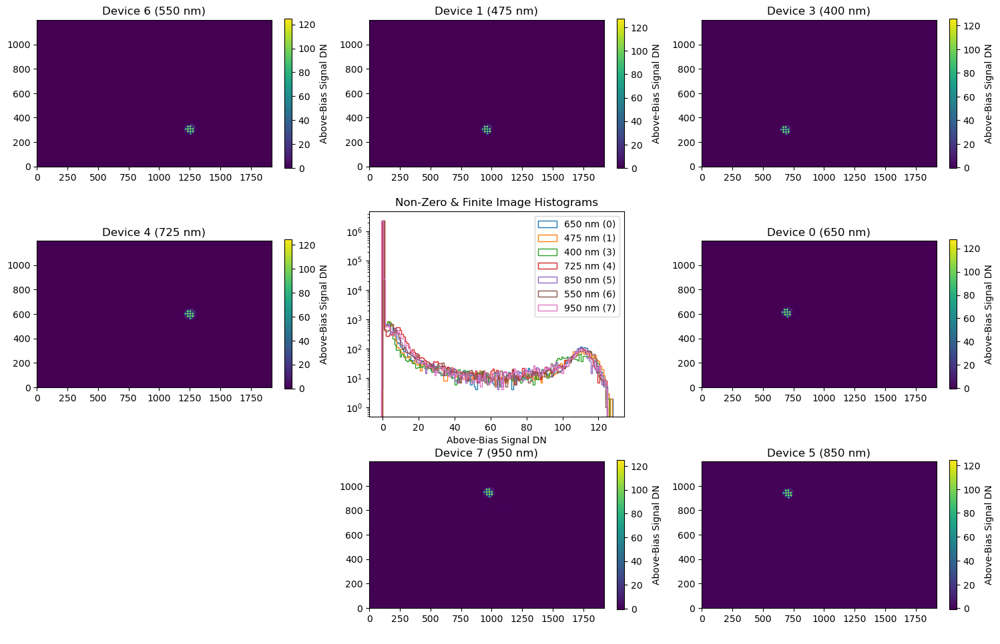

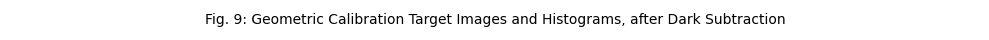

In [9]:
caption = f'Fig. {9}: Geometric Calibration Target Images and Histograms, after Dark Subtraction'
geocs = osp.load_geometric_calibration('geometric_calibration', caption=caption)

Here we see the target locations in each respective channel, illustrating the coalignment challenge.

Now we find the homography transforms from each channel to the 550 nm channel, and illustrate the transformed image error.

## Computing the Homography Matrix

Here we use a simple method of finding the projective transform, or homography matrix, that performs the linear transform from one channel, each with a unique pose, to another. As we have mutiple channels, we choose the 550 nm (Device 6) as the home position.

So the method involves finding corresponding points in the home channel, $\mathbf{x}_h$ and each other channels, $\mathbf{x}_c$, and then finding the homogarphy matrix $\mathbf{H}_{c}$ that solves the transformation, again for each channel paired with the home matrix.

For a point in the home channel $\mathbf{x}_h = [x_h, y_h, 1]$ and a point in the source channel $\mathbf{x}_c = [x_c, y_c, 1]$, the homography matrix is:

$ \begin{bmatrix} x_h \\ y_h \\ 1\\\end{bmatrix} = \alpha \begin{bmatrix}
h_1 & h_2 & h_3 \\
h_4 & h_5 & h_6 \\
h_7 & h_8 & h_9 \\
 \end{bmatrix} \begin{bmatrix} x_c \\ y_c \\ 1\\\end{bmatrix} $

Here we use the RANSAC method, implemented in OpenCV, to solve the homography matrix. This randomly samples subsets of the set of correspondance points, and use the Direct Linear Transform to find the homography matrix that minimises the projection error, solved with Singular Value Decomposition. After repeated random sampling, the best subset of points is chosen and used to find the final homography matrix.

### Finding matching points

We have used the checkerboard target in our images, but rather than using the accompanying checkerboard feature finder, provided by OpenCV, here we performed ORB feature finding, and the Hamming brute force method for match finding, discarding the bottom 20% of match distances.

### Verifying the image alignment

We demonstrate the success of the homography transform at aligning the images by applying the transform to the original images, and then displaying the differences between the images in the different channels.

Note it would be possible to verify the relfectance of the geometric target is approximately uniform across all channels.

Calibrating Homography for: 0 (650.0 nm)
...372 source points found
...368 destination points found
...297 matches found
Calibrating Homography for: 1 (475.0 nm)
...365 source points found
...368 destination points found
...292 matches found
Calibrating Homography for: 3 (400.0 nm)
...353 source points found
...368 destination points found
...282 matches found


/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:615: RuntimeWarning: divide by zero encountered in divide
  img = np.abs(query_reg-train_img)/train_img
/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:615: RuntimeWarning: invalid value encountered in divide
  img = np.abs(query_reg-train_img)/train_img


Calibrating Homography for: 4 (725.0 nm)
...353 source points found
...368 destination points found
...282 matches found
Calibrating Homography for: 5 (850.0 nm)
...341 source points found
...368 destination points found
...272 matches found
Calibrating Homography for: 6 (550.0 nm)
...368 source points found
...368 destination points found
...294 matches found
Calibrating Homography for: 7 (950.0 nm)
...350 source points found
...368 destination points found
...280 matches found


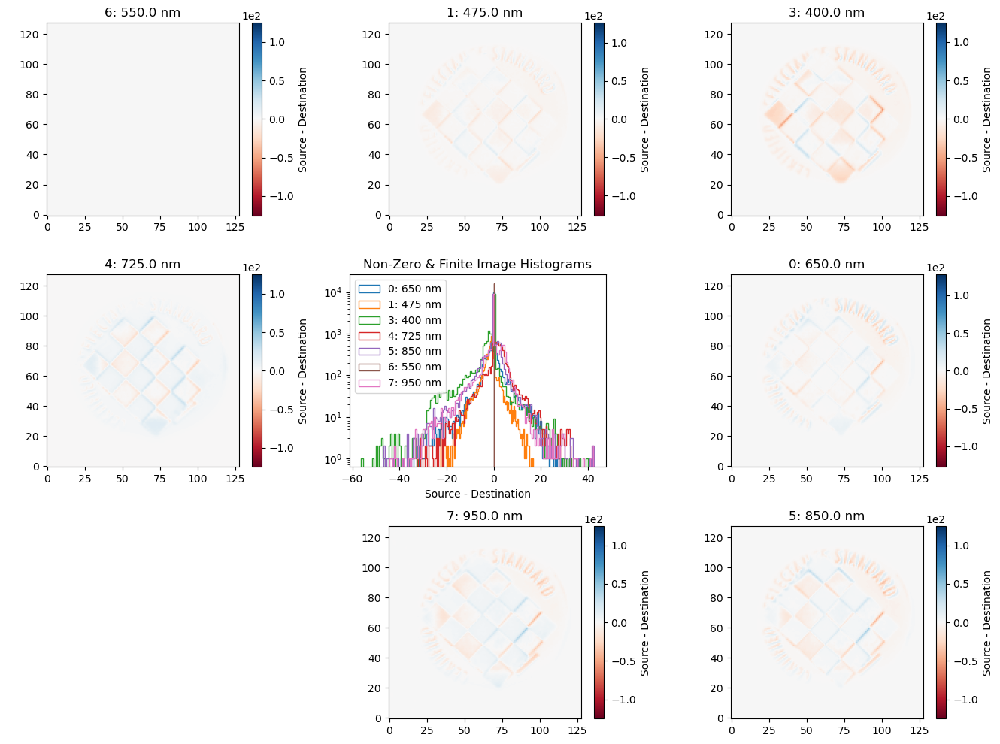

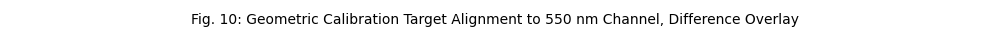

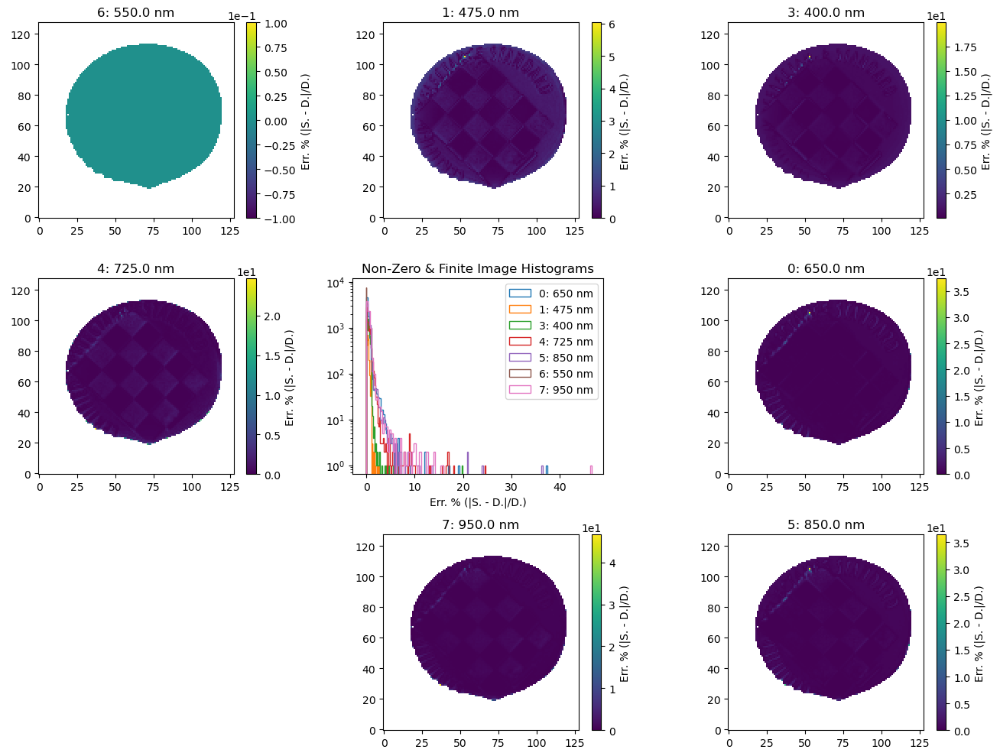

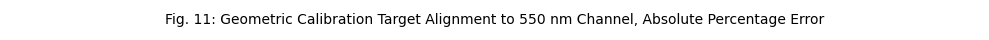

In [10]:
caption = (
    f'Fig. {10}: Geometric Calibration Target Alignment to 550 nm Channel, Difference Overlay',
    f'Fig. {11}: Geometric Calibration Target Alignment to 550 nm Channel, Absolute Percentage Error',
)
coals = osp.calibrate_homography(geocs, caption=caption)

We see that the matching generally finds a high number of match points, in the region of 280 - 300, to use for finding the homography matrix.

We can see that for all channels the majority of pixels are transformed with <=5% error, with error mostly occuring at object edges. This implies that low-frequency image detail will be preserved during transformations.

However, we know that the homography matrix strictly only applies for points that lie on the same plane. As we swap in alternative samples, it was not always possible to place the sample on the precise sample plane as the calibration target, due to limitations in the horizontal displacement of the sample holder. Further, some samples are simply not planar. For these cases, we should improve this method by performing complete stereo rectification and stereo matching on the images, to find disparity and depth, and to produce a 3D model of each sample, in spectral-stereo.

# Sample Reflectance Calibration and Coalignment

In this section we apply both the reflectance calibration and image co-alignment to our samples images.
First we load our sample images, for both right and left illumination incidence angles.

The steps are:
- Load, average and bias correct Sample images
- Correct for exposure
- Apply calibration coefficient frames
- Optional: mask for Calibration Target area and Sample area.
- Save reflectance images

Note that I do not offer any description or names for the samples, to keep these unlabelled.

# Sample 1

## Left (-30° Incidence) Illumination

### Reflectance Calibration

We load in the sample images, and immediately apply the reflectance correction.

Loaded images (img) for: 0 (650 nm)
Loading sample_1_l: 0 (650 nm)
Loaded images (drk) for: 0 (650 nm)
Subtracting dark frame for: 0 (650 nm)


/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:218: RuntimeWarning: divide by zero encountered in divide
  np.divide(img_ave, img_std, out=out, where=img_ave!=0)


Loaded images (img) for: 1 (475 nm)
Loading sample_1_l: 1 (475 nm)
Loaded images (drk) for: 1 (475 nm)
Subtracting dark frame for: 1 (475 nm)
Loaded images (img) for: 3 (400 nm)
Loading sample_1_l: 3 (400 nm)
Loaded images (drk) for: 3 (400 nm)
Subtracting dark frame for: 3 (400 nm)
Loaded images (img) for: 4 (725 nm)
Loading sample_1_l: 4 (725 nm)
Loaded images (drk) for: 4 (725 nm)
Subtracting dark frame for: 4 (725 nm)
Loaded images (img) for: 5 (850 nm)
Loading sample_1_l: 5 (850 nm)
Loaded images (drk) for: 5 (850 nm)
Subtracting dark frame for: 5 (850 nm)
Loaded images (img) for: 6 (550 nm)
Loading sample_1_l: 6 (550 nm)
Loaded images (drk) for: 6 (550 nm)
Subtracting dark frame for: 6 (550 nm)
Loaded images (img) for: 7 (950 nm)
Loading sample_1_l: 7 (950 nm)
Loaded images (drk) for: 7 (950 nm)
Subtracting dark frame for: 7 (950 nm)


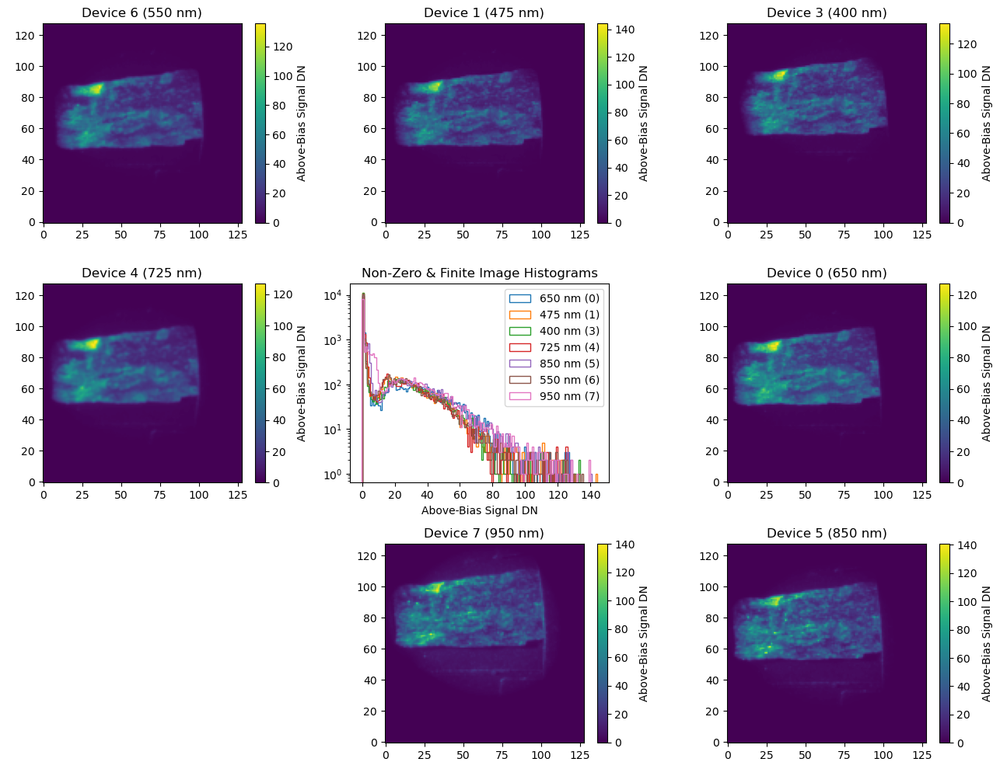

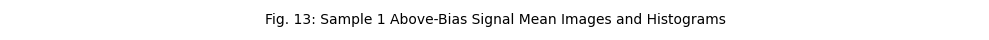

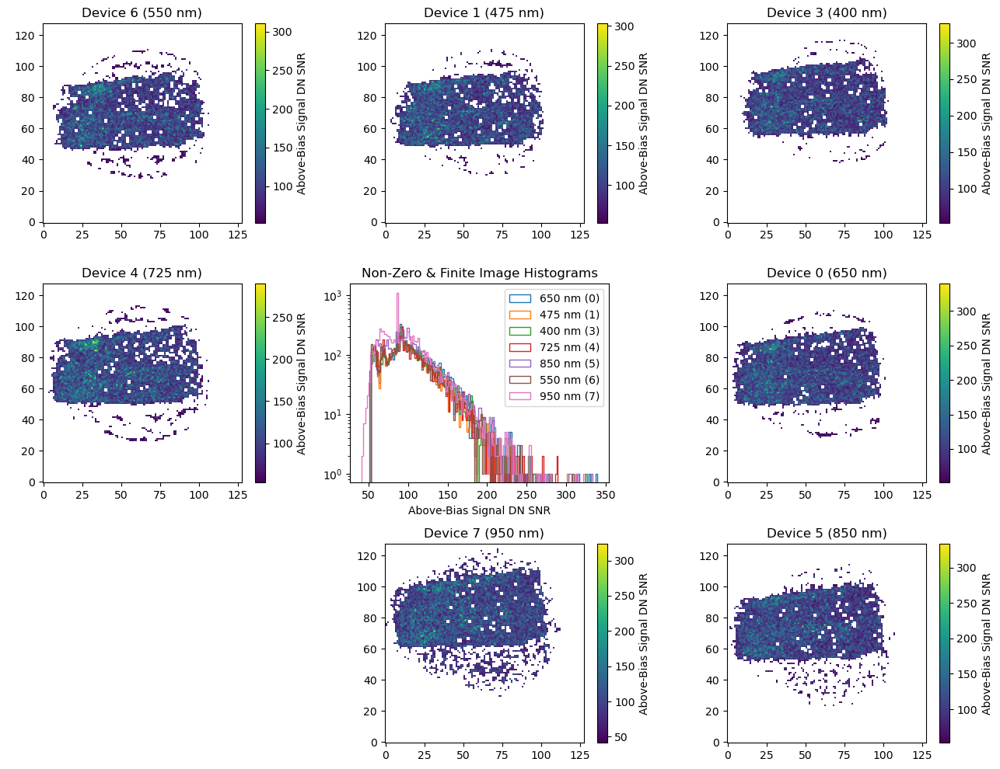

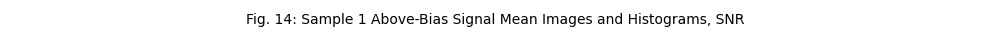

In [11]:
caption = (
    f'Fig. {13}: Sample 1 Above-Bias Signal Mean Images and Histograms',    
    f'Fig. {14}: Sample 1 Above-Bias Signal Mean Images and Histograms, SNR',
)
smpl_imgs = osp.load_sample('sample_1_l', roi=True, caption=caption)

We can see that the channels are mostly in focus, and that there exist some bright regions that approximately correlate across all channels.

Now we apply the reflectance calibration:

/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:436: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave


../data/sample_1_l/0_650
Mean image written to ../data/sample_1_l/0_650/650_mean_rfl.tif
Error image written to ../data/sample_1_l/0_650/650_error_rfl.tif
../data/sample_1_l/1_475
Mean image written to ../data/sample_1_l/1_475/475_mean_rfl.tif
Error image written to ../data/sample_1_l/1_475/475_error_rfl.tif
../data/sample_1_l/3_400
Mean image written to ../data/sample_1_l/3_400/400_mean_rfl.tif
Error image written to ../data/sample_1_l/3_400/400_error_rfl.tif
../data/sample_1_l/4_725
Mean image written to ../data/sample_1_l/4_725/725_mean_rfl.tif
Error image written to ../data/sample_1_l/4_725/725_error_rfl.tif
../data/sample_1_l/5_850
Mean image written to ../data/sample_1_l/5_850/850_mean_rfl.tif
Error image written to ../data/sample_1_l/5_850/850_error_rfl.tif
../data/sample_1_l/6_550
Mean image written to ../data/sample_1_l/6_550/550_mean_rfl.tif
Error image written to ../data/sample_1_l/6_550/550_error_rfl.tif
../data/sample_1_l/7_950
Mean image written to ../data/sample_1_l/7_95

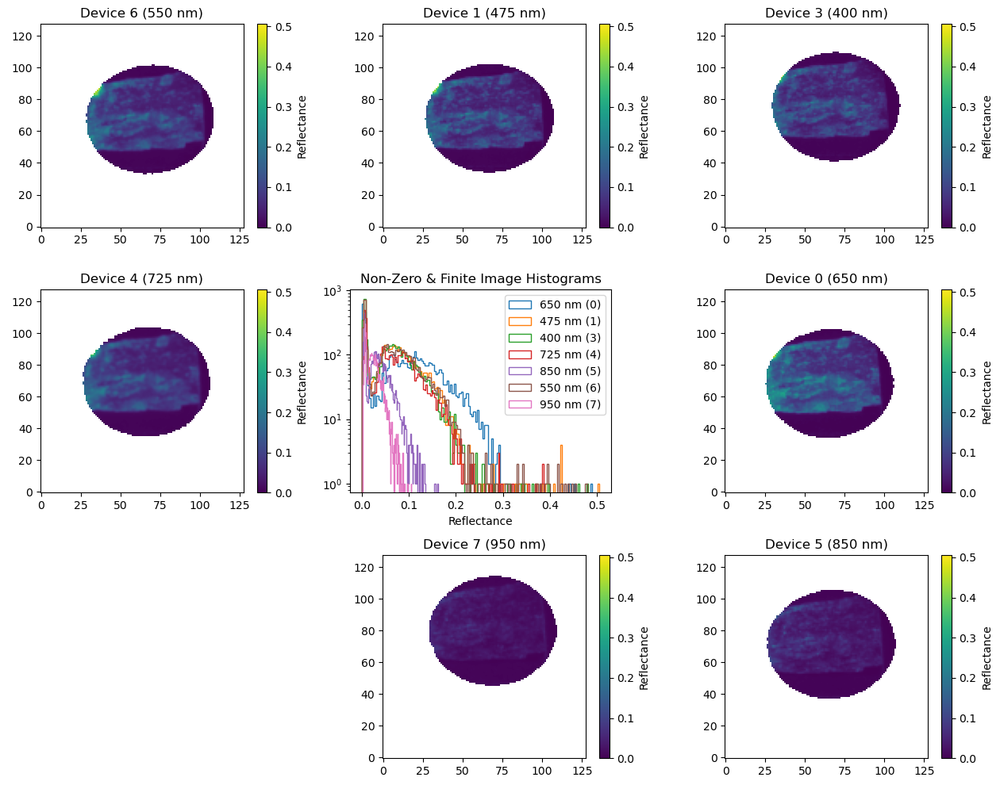

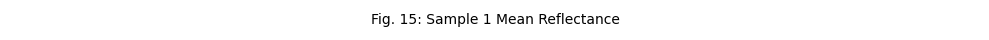

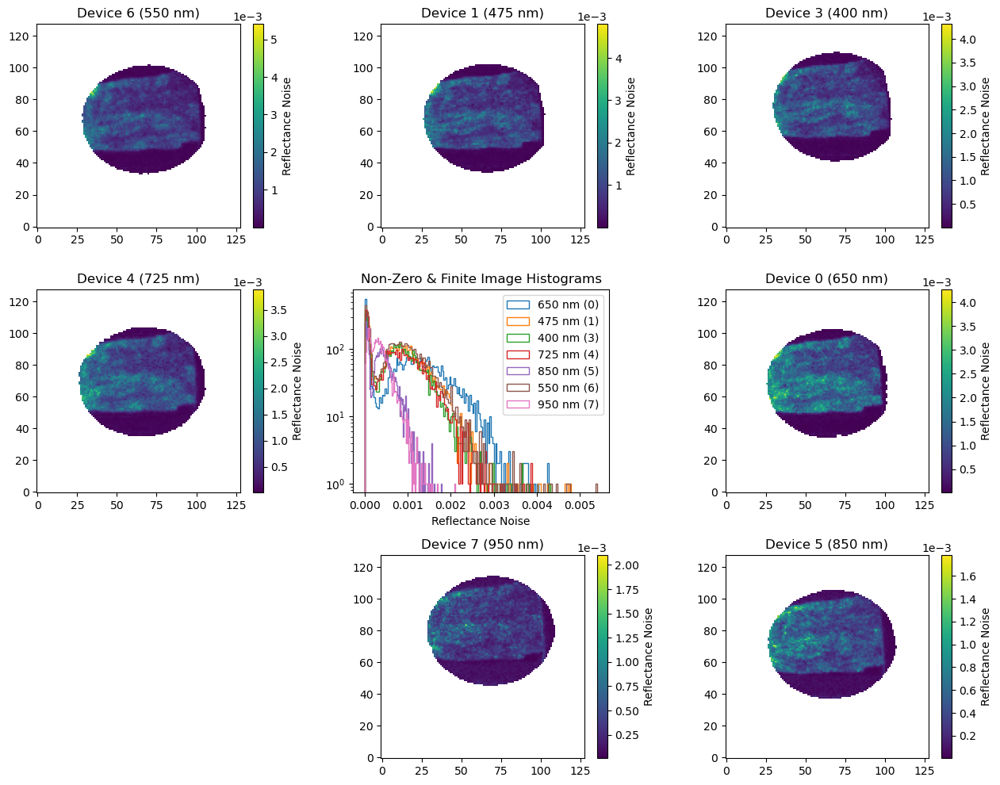

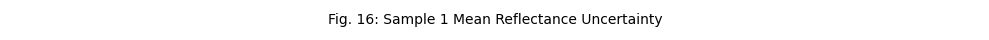

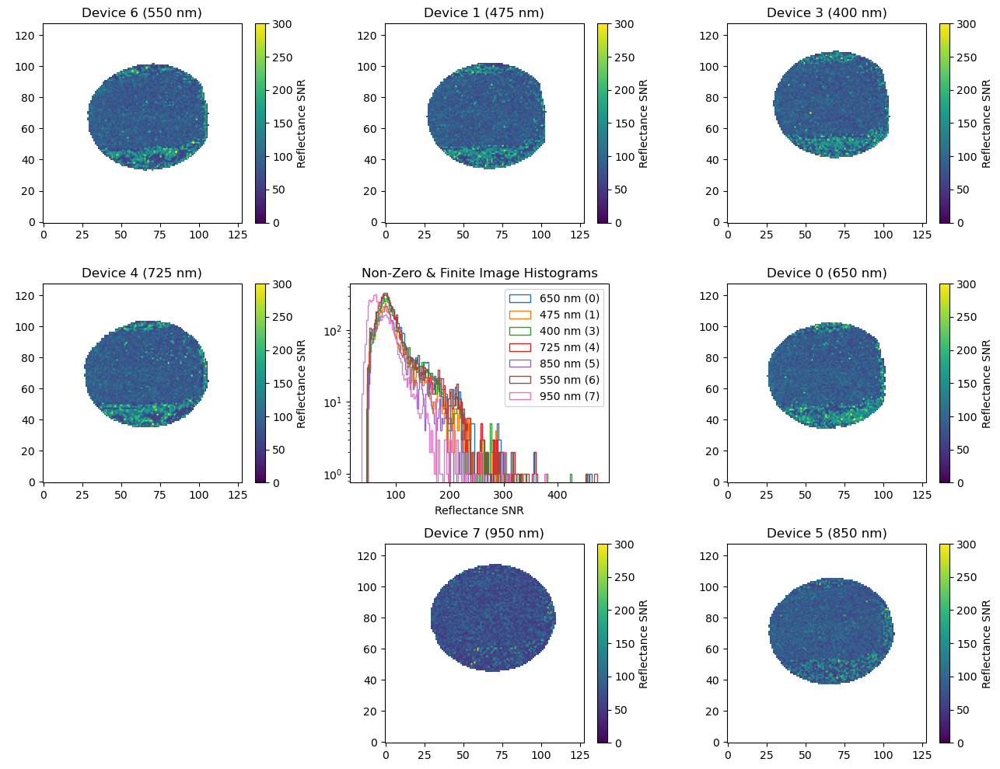

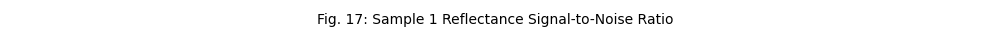

In [12]:
caption = (
    f'Fig. {15}: Sample 1 Mean Reflectance',
    f'Fig. {16}: Sample 1 Mean Reflectance Uncertainty',
    f'Fig. {17}: Sample 1 Reflectance Signal-to-Noise Ratio'
)
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs, caption=caption)

We can see that once calibrated to reflectance, most channels have a peak reflectance in the region of ~5%, with fat and long-tailed distributions, with the birghtest pixels exhibitng up to 40% reflectance.

We also see that most channels have a mean SNR of ~100, with long-tailed log-normal distributions.

### On the Signal-to-Noise Ratio

Here we note that our target SNR is $\ge122$, in order to detect the ~3 - 4 % depth of the 750 nm hydration feature.

This implies that the images captured here are not sufficiently exposed to reach the desired noise levels.

Let's look in to the performance expected of the detector, under shot-limited assumptions.

The gain is 7.979 e-/DN in 12-bit mode, giving a Full Well (assuming linearity) of 32682 e-.
So the maximum possible SNR is ~180.
To achieve an SNR $\ge122$ requires an electron count of 14884 e-, or 45% of the camera response.

After accounting for the 10% bias level applied, of 25.5 DN, this requires an Above-Bias Signal of 103.25 DN.

Note again that this considers the shot-limited noise case, so this estimate is liberal, and in reality a slightly higher signal may be required.

Note also that the propagation of uncertainty of the reflectance calibration will also reduce the SNR.

We validate this rudimentary estimate of the signal requirement by applying a mask to the input image that blocks all pixels below a threshold of 103.25 DN, and then consider the SNR first of the resultant image, and then of the propagated reflectance image.



Loaded images (img) for: 0 (650 nm)
Loading sample_1_l: 0 (650 nm)
Loaded images (drk) for: 0 (650 nm)
Subtracting dark frame for: 0 (650 nm)
Loaded images (img) for: 1 (475 nm)
Loading sample_1_l: 1 (475 nm)
Loaded images (drk) for: 1 (475 nm)
Subtracting dark frame for: 1 (475 nm)
Loaded images (img) for: 3 (400 nm)
Loading sample_1_l: 3 (400 nm)
Loaded images (drk) for: 3 (400 nm)
Subtracting dark frame for: 3 (400 nm)
Loaded images (img) for: 4 (725 nm)
Loading sample_1_l: 4 (725 nm)
Loaded images (drk) for: 4 (725 nm)
Subtracting dark frame for: 4 (725 nm)
Loaded images (img) for: 5 (850 nm)
Loading sample_1_l: 5 (850 nm)
Loaded images (drk) for: 5 (850 nm)
Subtracting dark frame for: 5 (850 nm)
Loaded images (img) for: 6 (550 nm)
Loading sample_1_l: 6 (550 nm)
Loaded images (drk) for: 6 (550 nm)
Subtracting dark frame for: 6 (550 nm)
Loaded images (img) for: 7 (950 nm)
Loading sample_1_l: 7 (950 nm)
Loaded images (drk) for: 7 (950 nm)
Subtracting dark frame for: 7 (950 nm)


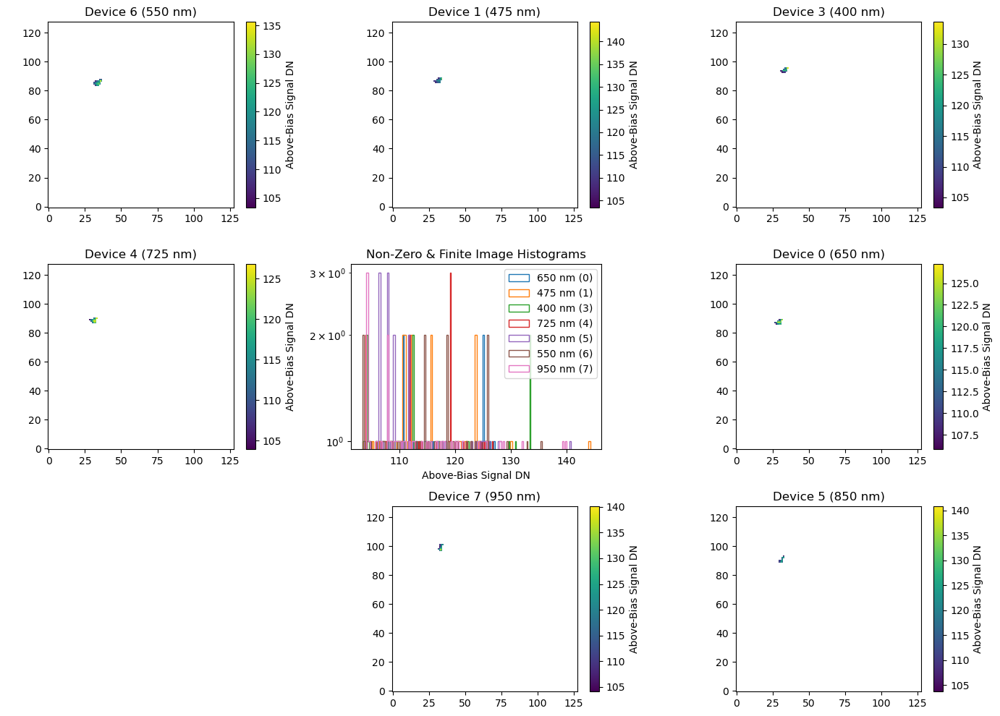

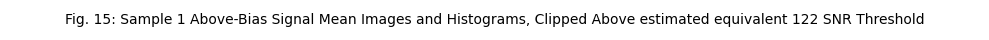

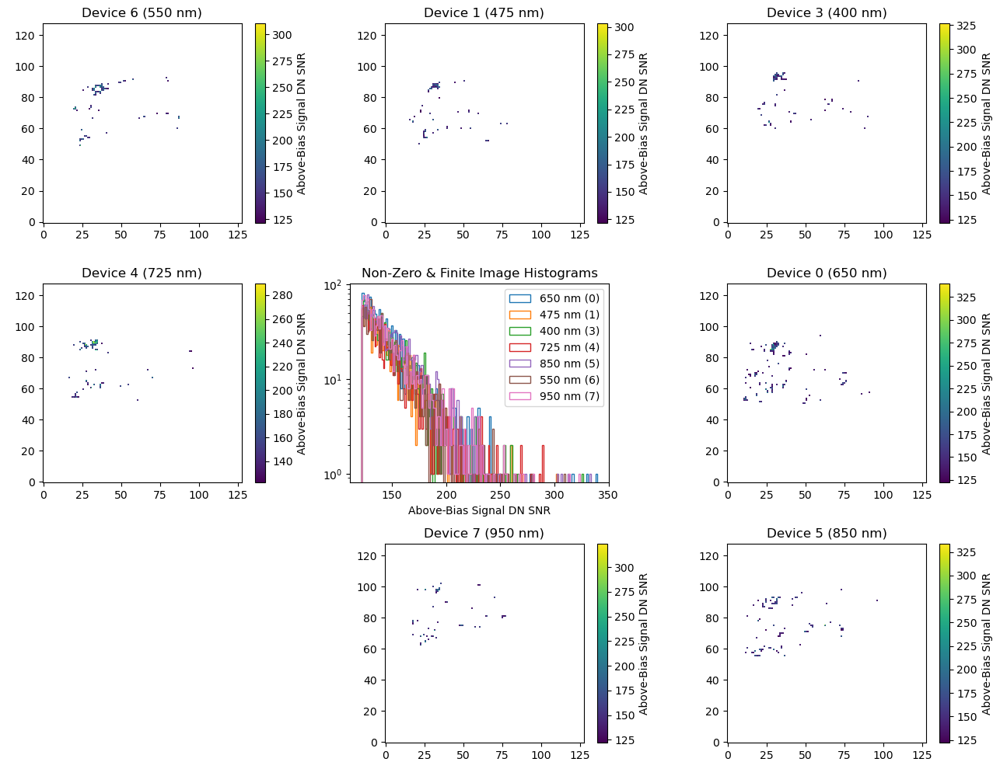

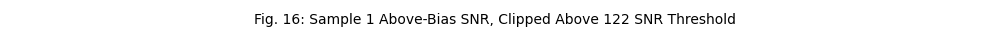

In [13]:
caption = (
    f'Fig. {15}: Sample 1 Above-Bias Signal Mean Images and Histograms, Clipped Above estimated equivalent 122 SNR Threshold',    
    f'Fig. {16}: Sample 1 Above-Bias SNR, Clipped Above 122 SNR Threshold'    
)
smpl_imgs = osp.load_sample('sample_1_l', roi=True, caption=caption, threshold=(103.25,122))

So we see that here, none of the images satisfy the criteria of exceeding an SNR of 122.

This calls for a review of the SNR requirements, and an upgrade of the image capture routine auto-exposure to ensure that all pixels of the sample exceed this threshold. Note that we also placed an upper limit of exposure of 150 DN, to avoid moving into the region of non-linearity in the response. We shall also need to investigate and validate if this is upper limit is required. This can be performed with a simple linearity experiment on each camera, in which the exposure over the spectralon calibration target is incremented. We will also be able to capture a Photon Transfer Curve in this manner, so a complete characterisation experiment should be performed.

In this notebook, we continue with our analysis, and consider whether the other samples are also exposed sufficiently.

### Geometric Alignment

Now we apply the geometric alignment to the sample, to map all channels to the position of the 650 nm channel.

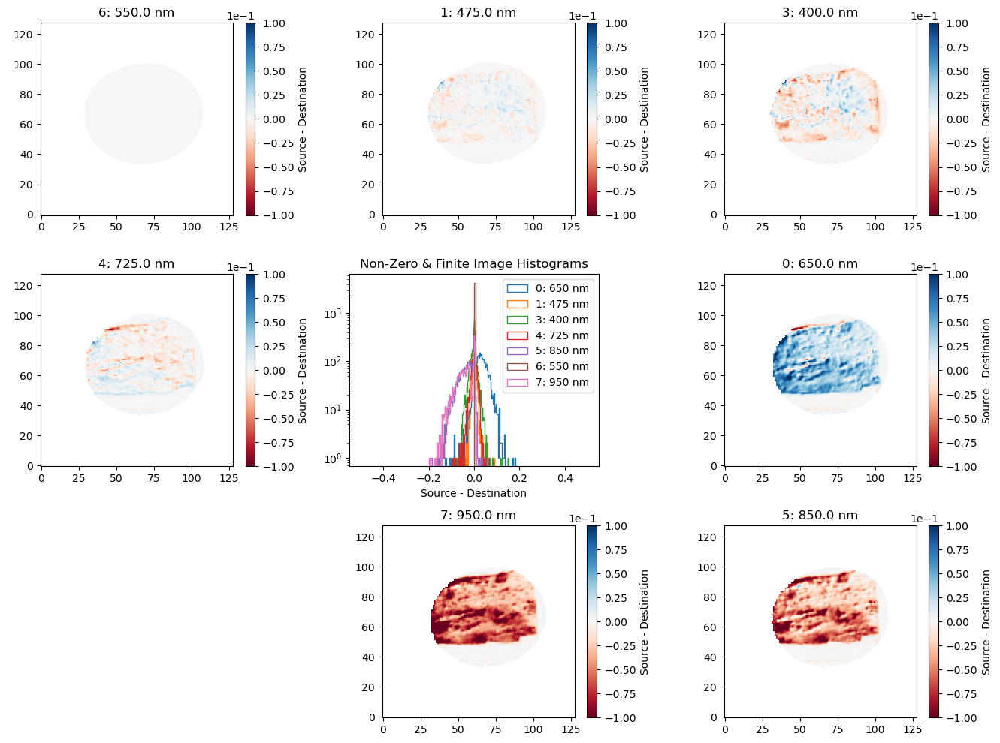

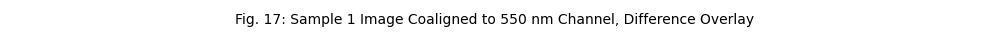

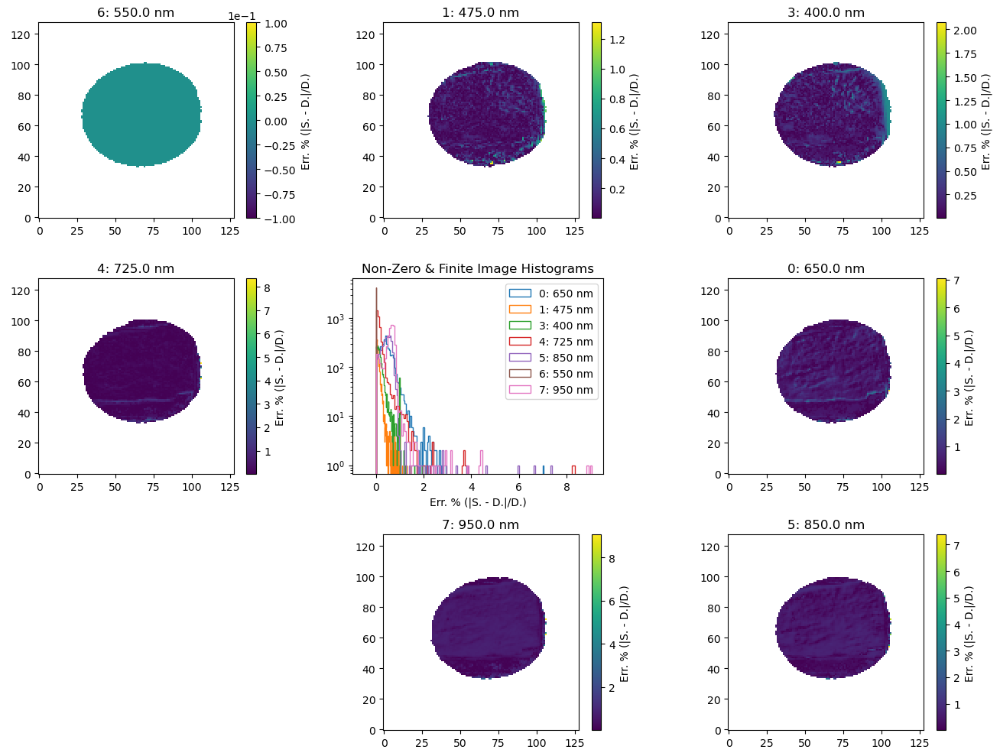

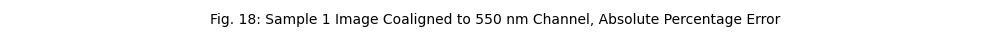

In [14]:
caption = (
    f'Fig. {17}: Sample 1 Image Coaligned to 550 nm Channel, Difference Overlay',
    f'Fig. {18}: Sample 1 Image Coaligned to 550 nm Channel, Absolute Percentage Error'
)
aligned_refl = osp.apply_coalignment(reflectance, coals, caption=caption)

We see that typically the alignment error is below 5%, and that visually the alignment appears to have been succesful.
We could be more rigorous here, and apply some histogram equalisation prior to the comparison, to provide a closer comparison of the images.

The problem with comparing the images is that the spectral channels are different, so we do of course expect there to be changes in the image distribution. Histogram equalisation may be the best tool for tackling this disparity.

What is still unclear is how to account for this uncertainty source in the propagation of the pixel level error.

### Reflectance ROI Selection and Plotting

We can manually select a Region of Interest to extract the reflectance over.

First, lets look coarsely over the entire sample, to look at the distributions of values in the channel histograms.

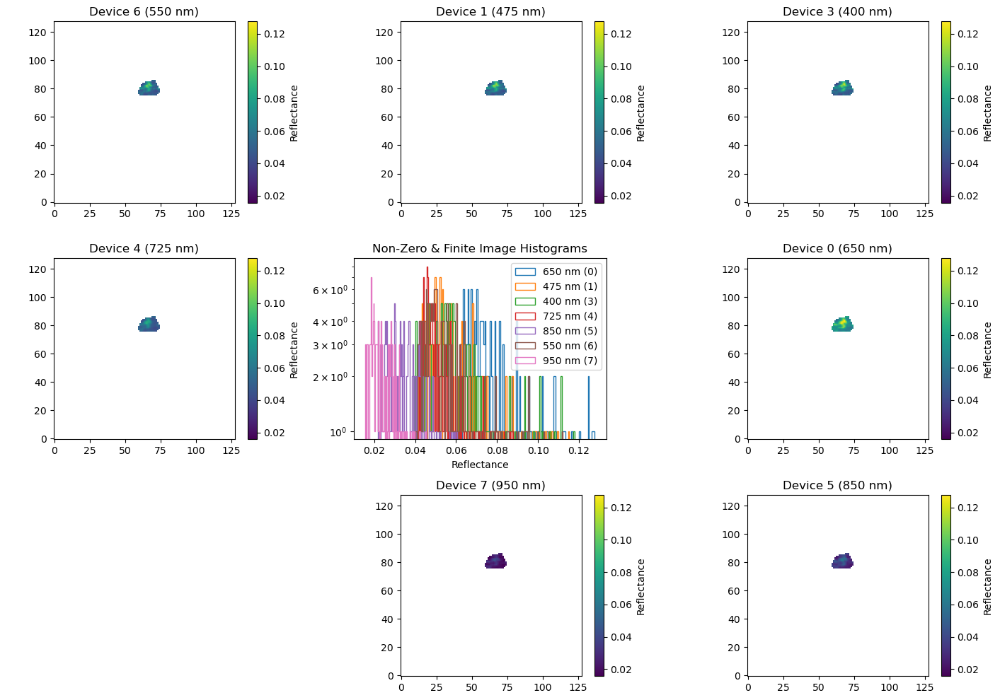

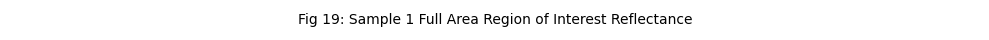

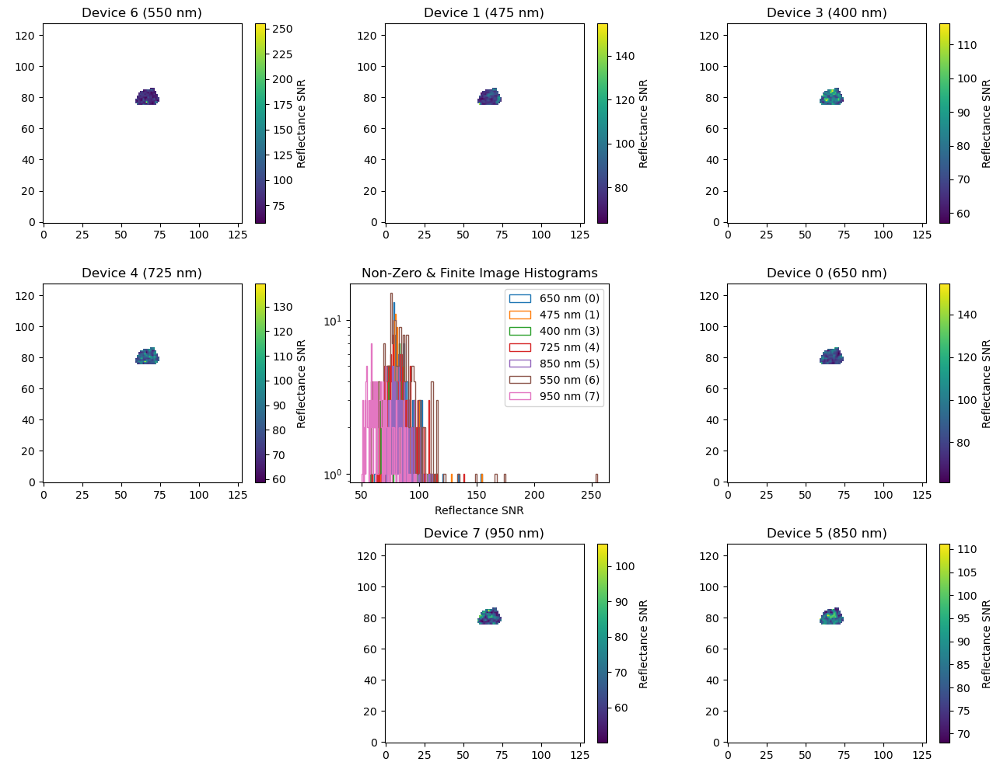

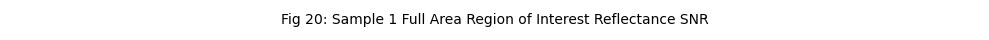

In [15]:
caption = (
    f'Fig {19}: Sample 1 Full Area Region of Interest Reflectance',
    f'Fig {20}: Sample 1 Full Area Region of Interest Reflectance SNR'
)
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550', caption=caption)

All colorbars have equal range across these plots, so we can directly compare the reflectance. We can see that the 950 and 850 nm channels have low reflectance, followed by the 400 nm channel, with the remaining channels all exhibiting similar ranges of values. Notes also that the histograms are mostly unimodal, with some long-tailed outliers.

Looking at the SNR figures, we see that all channels achieve similar SNR, as expected given the scaling of exposure times, with the exception of the 950 nm channel, that, as expected, has lower performance due to the presence of dark signal.

We can average over the Region of Interest, and plot the mean reflectance, and standard deviation of the reflectance over this area:

The mean is given by:

$\bar{R}_{\mu} = \frac{1}{N_{ROI}}\sum_{i,j \in ROI} R[i,j]$

and the standard deviation given by:

$\bar{R}_{\sigma} = \frac{1}{N_{ROI}}\sum_{i,j \in ROI} (R[i,j] - R_{\mu})^2$

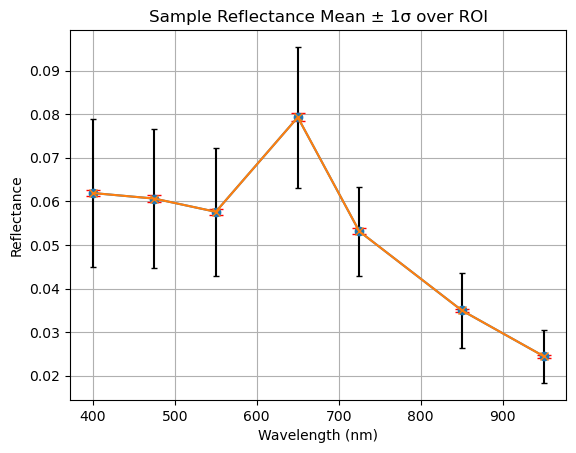

In [16]:
caption = f'Fig {21}: Sample 1 Full Area Average Region of Interest Reflectance Plot'
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois, weighted=False, caption=caption)

Here, the error bars represent the variance of pixel values across the Region of Interest (ROI), i.e. the spatial nonuniformity of the sample area.

In this case, where the ROI spans the entire sample area, we would expect these error bars to be large, and indeed that is what we see here.

However, these errors do no currently represent the noise associated with each pixel. To account for these, we can also visualise the average error over the region of interest, and also display this in the error bars:

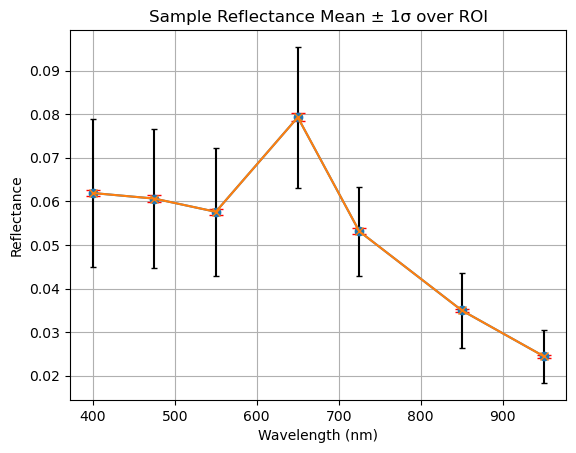

In [17]:
caption = f'Fig {21}: Sample 1 Full Area Average Region of Interest Reflectance Plot with Average Noise'
left_results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois, weighted=False, caption=caption)

However, this is a somewhat deceptive representation of this information. These smaller error bars have been derived from repeated imaging, so each data point is in a sense a representation of 10 (numebr of repeat images) datapoints. A truer representation of the data would involve, rather than averaging in the'time-domain', and then avergaing in the spatial domain, simply treating all pixels as a total set, and finding the mean and standard deviation across all of these. Then, as the image becomes more uniform, we would expect the standard deviation to tend towards the instrument error we see here. 

Ok, so now we should interpret the smaller errors bars as the lowest achievable limit of uncertainty - i.e. if there was no spatial heterogeniety.


### Removing Spatial Heterogeneity by Normalisation

We can supress the spatial heterogeneity by normalising the images to the 550 nm channel, to give $\hat{R}$:

$\hat{R}_{\mu, c} = \frac{R_{\mu, c}}{R_{\mu, 550}}$

with uncertainty propagated to give:

$\hat{R}_{\sigma, c} = \hat{R}_{\mu, c} \sqrt{\frac{R_{\sigma,c}}{R_{\mu, c}}^2 + \frac{R_{\sigma, 550}}{R_{\mu, 550}}^2}$

/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:444: RuntimeWarning: invalid value encountered in divide
  self_err = self.img_std/self.img_ave
/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:446: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:446: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave


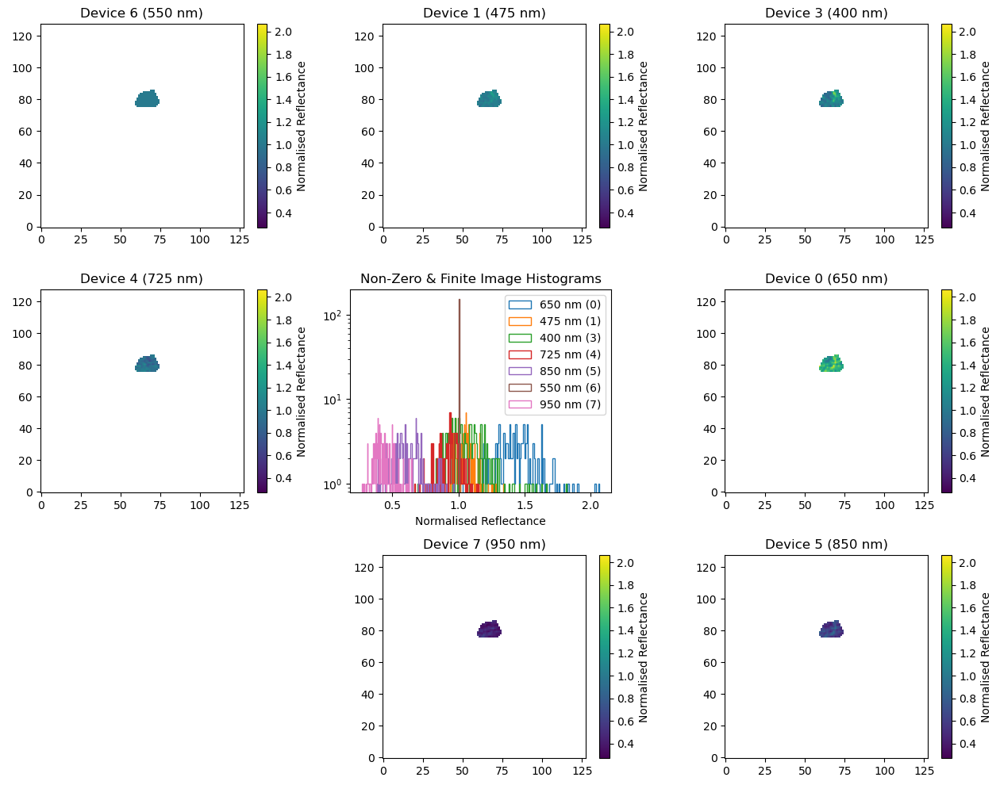

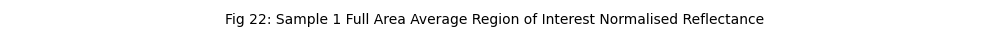

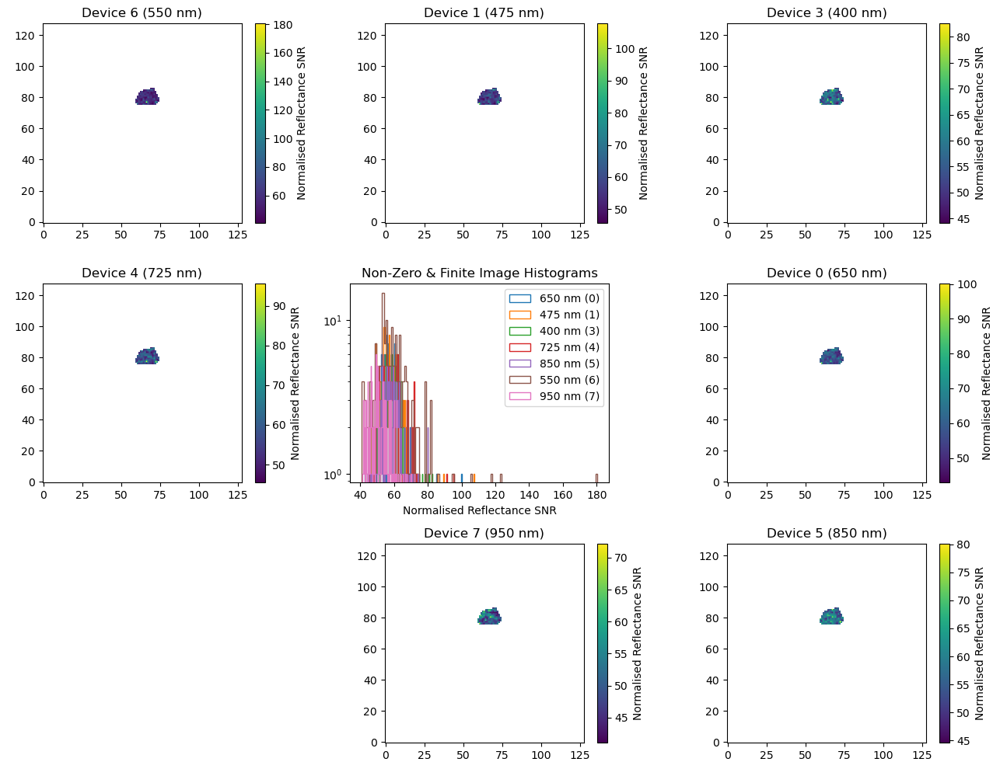

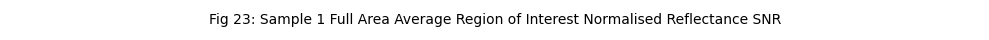

In [18]:
caption = (
    f'Fig {22}: Sample 1 Full Area Average Region of Interest Normalised Reflectance',
    f'Fig {23}: Sample 1 Full Area Average Region of Interest Normalised Reflectance SNR',
)
norm_refl = osp.normalise_reflectance(aligned_refl, caption=caption)

We see that, by visual inspection, the spatial variance has appeared to decrease, although it has not been irradicated entirely, implying a mixture of poor image alignment, and spatial variance in reflectance properties (that we would expect). We also see that the propagation of the noise during normalised leads to a reduction in the SNR. This should be considered when accounting for the total reflectance signal-to-noise ratio of the final image products.

Plotting the normalised mean values, and areal standard deviation, and pixel-level lower noise limit:

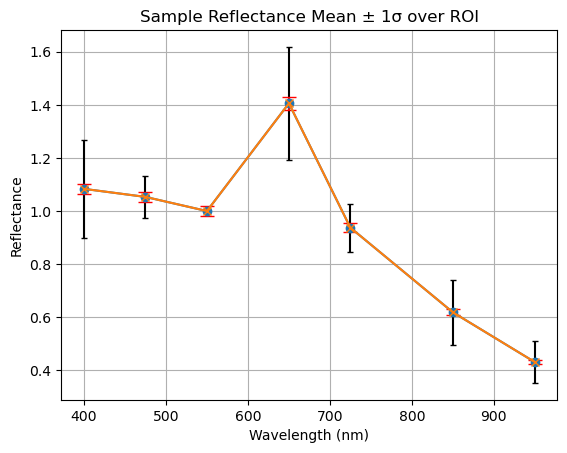

In [19]:
caption = f'Fig {24}: Sample 1 Full Area Average Region of Interest Normalised Reflectance Plot'
left_norm_results = osp.plot_roi_reflectance(refl_imgs=norm_refl, caption=caption)

we see that the spatial standard deviation remains much greater than the theoretical lower limit of the noise.

Our first apporach to tackling this should be to investgate more robust ways of image co-alignment. We can also investigate this by imaging an approximately spectrally uniform sample that contains spatial detail. I.e. we could take a 3D printed model, and coat it in a material of uniform spectral reflectance.

There is a more appropiate alternative though, I think, and that is to perform imaging with a duplicate spectral channel, and attempt image co-alignment with this channel, to check if the alignment routine, in general, completely corrects for pixel mis-alignment.

Fortunately we have a duplicate 550 nm filter camera, that we can place in the number 8 position of the camera rig - notably the most extreme displacement postion. This will serve as a suitable ground-truth, where we would expect that reflectance values will match those of the current 550 nm channel, and that after image co-alignment, the error will be 0 (if performing ideally), and that any error can be considered as the expected error on all other channels.

**Action: Install duplicate 550 nm channel in position Number 8 (and ensure pipeline is capable of handling this etc.)**

Before doing this though, we can still investigate alternatives to the current image co-alignment system, in particular, using the method of stereo rectification and matching.

For now, we continue with the processing, and consider the illumination of this sample from the right (+30° incidence angle).

## Right (+30° incidence) Illumination

### Reflectance Calibration

Loaded images (img) for: 0 (650 nm)
Loading sample_1_r: 0 (650 nm)
Loaded images (drk) for: 0 (650 nm)
Subtracting dark frame for: 0 (650 nm)


/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:218: RuntimeWarning: divide by zero encountered in divide
  np.divide(img_ave, img_std, out=out, where=img_ave!=0)


Loaded images (img) for: 1 (475 nm)
Loading sample_1_r: 1 (475 nm)
Loaded images (drk) for: 1 (475 nm)
Subtracting dark frame for: 1 (475 nm)
Loaded images (img) for: 3 (400 nm)
Loading sample_1_r: 3 (400 nm)
Loaded images (drk) for: 3 (400 nm)
Subtracting dark frame for: 3 (400 nm)
Loaded images (img) for: 4 (725 nm)
Loading sample_1_r: 4 (725 nm)
Loaded images (drk) for: 4 (725 nm)
Subtracting dark frame for: 4 (725 nm)
Loaded images (img) for: 5 (850 nm)
Loading sample_1_r: 5 (850 nm)
Loaded images (drk) for: 5 (850 nm)
Subtracting dark frame for: 5 (850 nm)
Loaded images (img) for: 6 (550 nm)
Loading sample_1_r: 6 (550 nm)
Loaded images (drk) for: 6 (550 nm)
Subtracting dark frame for: 6 (550 nm)
Loaded images (img) for: 7 (950 nm)
Loading sample_1_r: 7 (950 nm)
Loaded images (drk) for: 7 (950 nm)
Subtracting dark frame for: 7 (950 nm)


/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:436: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave


../data/sample_1_r/0_650
Mean image written to ../data/sample_1_r/0_650/650_mean_rfl.tif
Error image written to ../data/sample_1_r/0_650/650_error_rfl.tif
../data/sample_1_r/1_475
Mean image written to ../data/sample_1_r/1_475/475_mean_rfl.tif
Error image written to ../data/sample_1_r/1_475/475_error_rfl.tif
../data/sample_1_r/3_400
Mean image written to ../data/sample_1_r/3_400/400_mean_rfl.tif
Error image written to ../data/sample_1_r/3_400/400_error_rfl.tif
../data/sample_1_r/4_725
Mean image written to ../data/sample_1_r/4_725/725_mean_rfl.tif
Error image written to ../data/sample_1_r/4_725/725_error_rfl.tif
../data/sample_1_r/5_850
Mean image written to ../data/sample_1_r/5_850/850_mean_rfl.tif
Error image written to ../data/sample_1_r/5_850/850_error_rfl.tif
../data/sample_1_r/6_550
Mean image written to ../data/sample_1_r/6_550/550_mean_rfl.tif
Error image written to ../data/sample_1_r/6_550/550_error_rfl.tif
../data/sample_1_r/7_950
Mean image written to ../data/sample_1_r/7_95

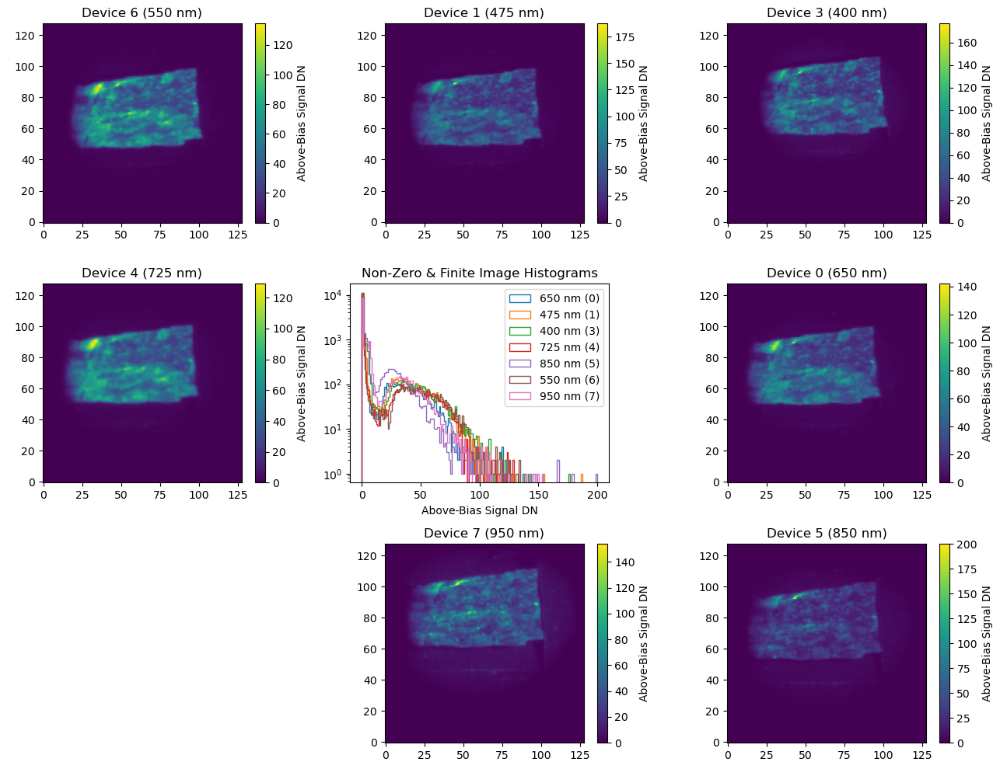

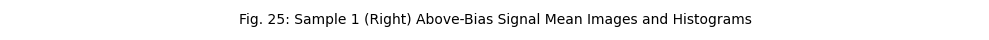

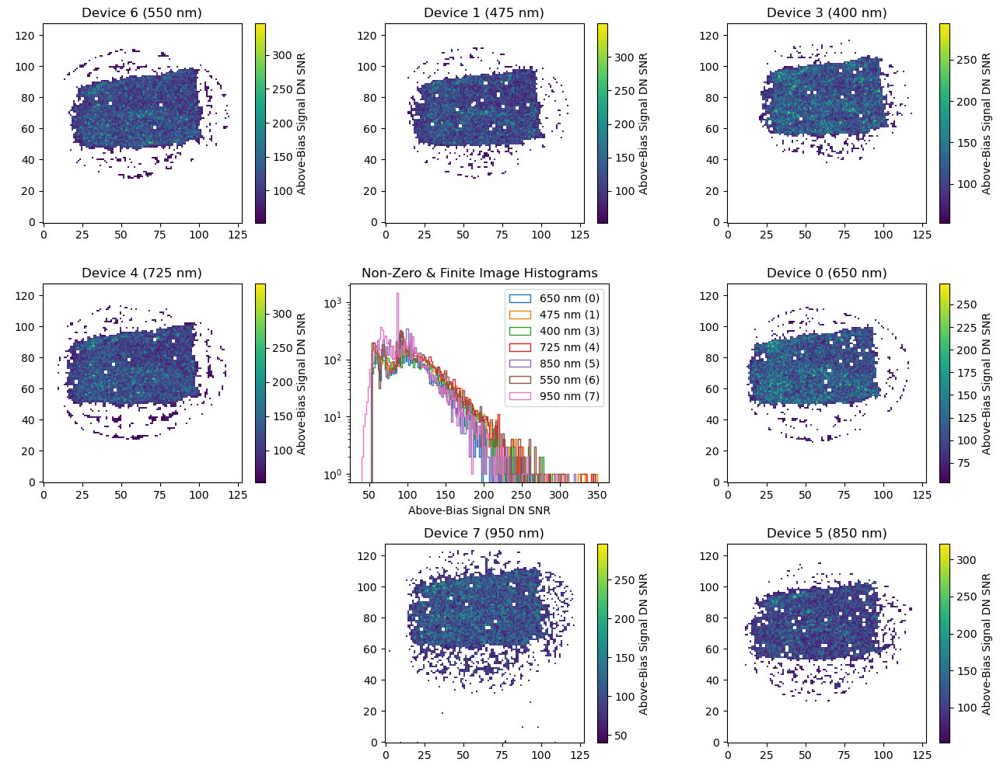

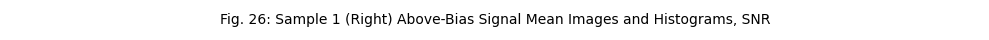

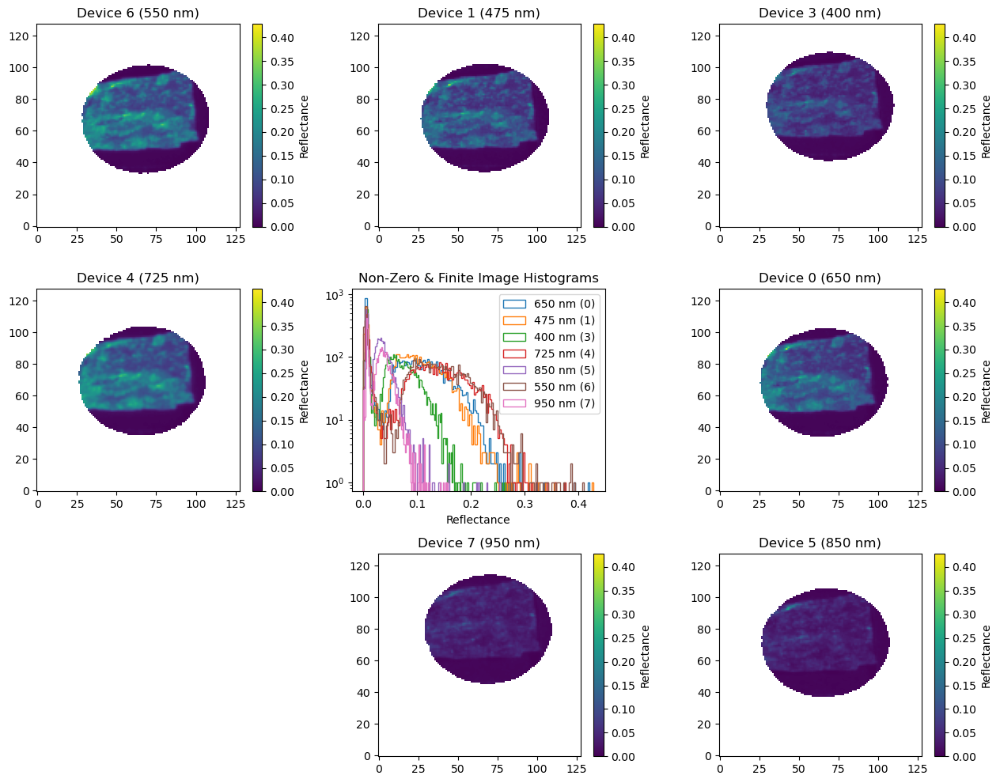

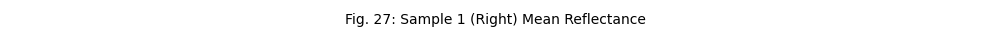

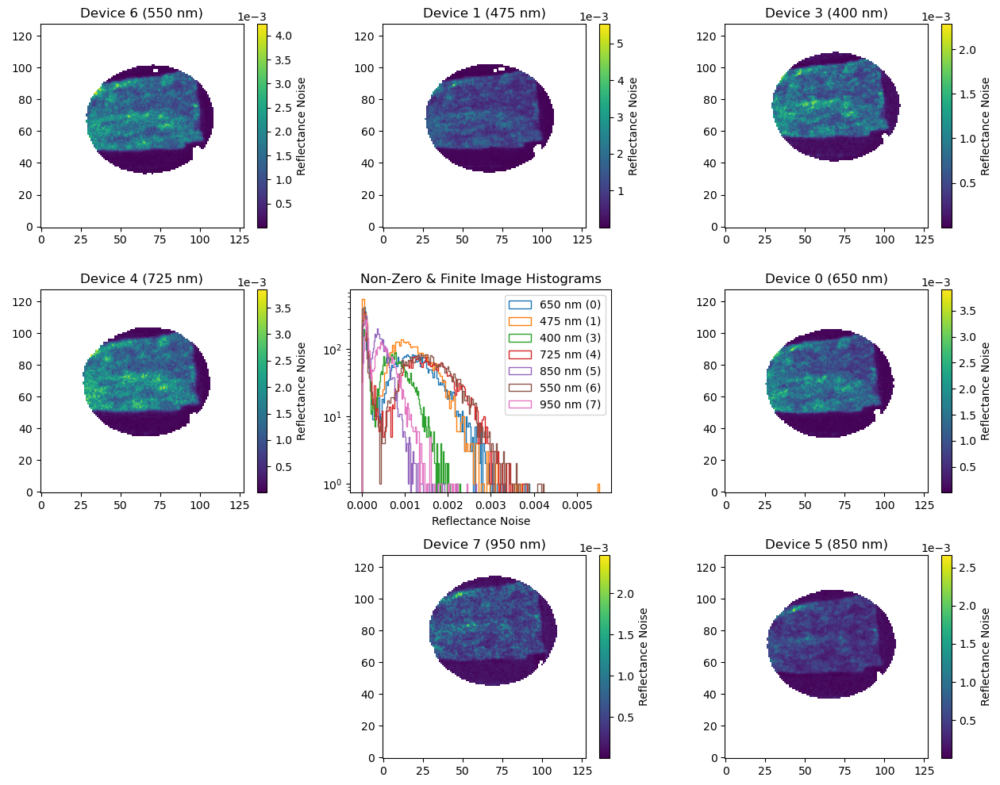

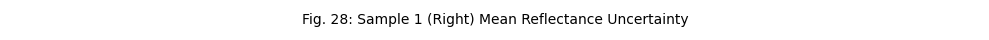

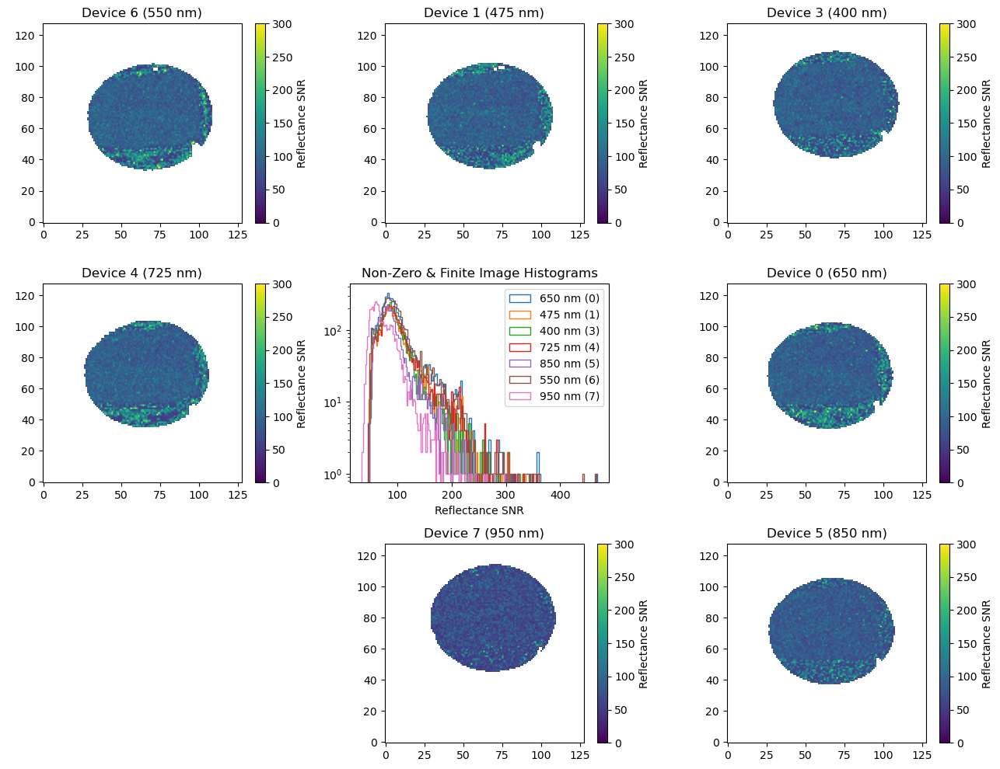

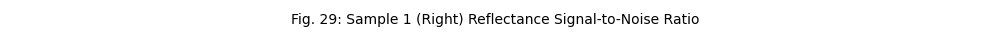

In [20]:
caption = (
    f'Fig. {25}: Sample 1 (Right) Above-Bias Signal Mean Images and Histograms',    
    f'Fig. {26}: Sample 1 (Right) Above-Bias Signal Mean Images and Histograms, SNR',
)
smpl_imgs = osp.load_sample('sample_1_r', roi=True, caption=caption)
caption = (
    f'Fig. {27}: Sample 1 (Right) Mean Reflectance',
    f'Fig. {28}: Sample 1 (Right) Mean Reflectance Uncertainty',
    f'Fig. {29}: Sample 1 (Right) Reflectance Signal-to-Noise Ratio'
)
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs, caption=caption)

We see that there are similar values for Reflectance and SNR for the sample.

### Geometric Alignment

/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:615: RuntimeWarning: divide by zero encountered in divide
  img = np.abs(query_reg-train_img)/train_img
/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:615: RuntimeWarning: invalid value encountered in divide
  img = np.abs(query_reg-train_img)/train_img


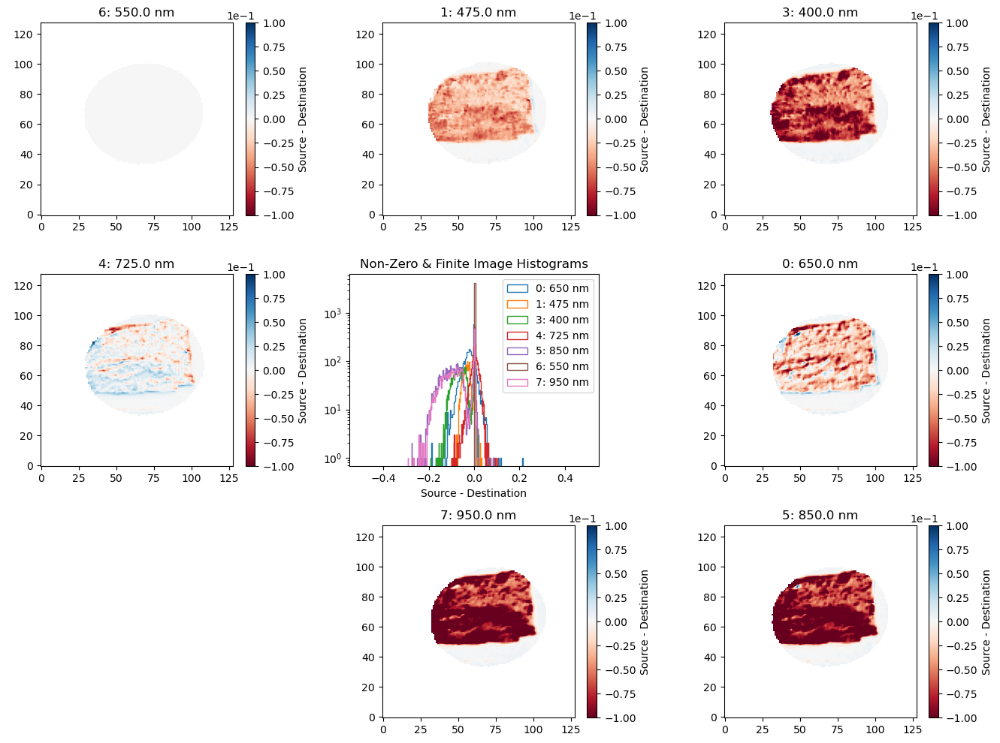

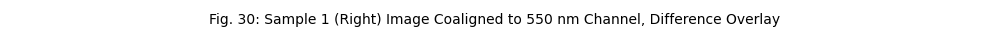

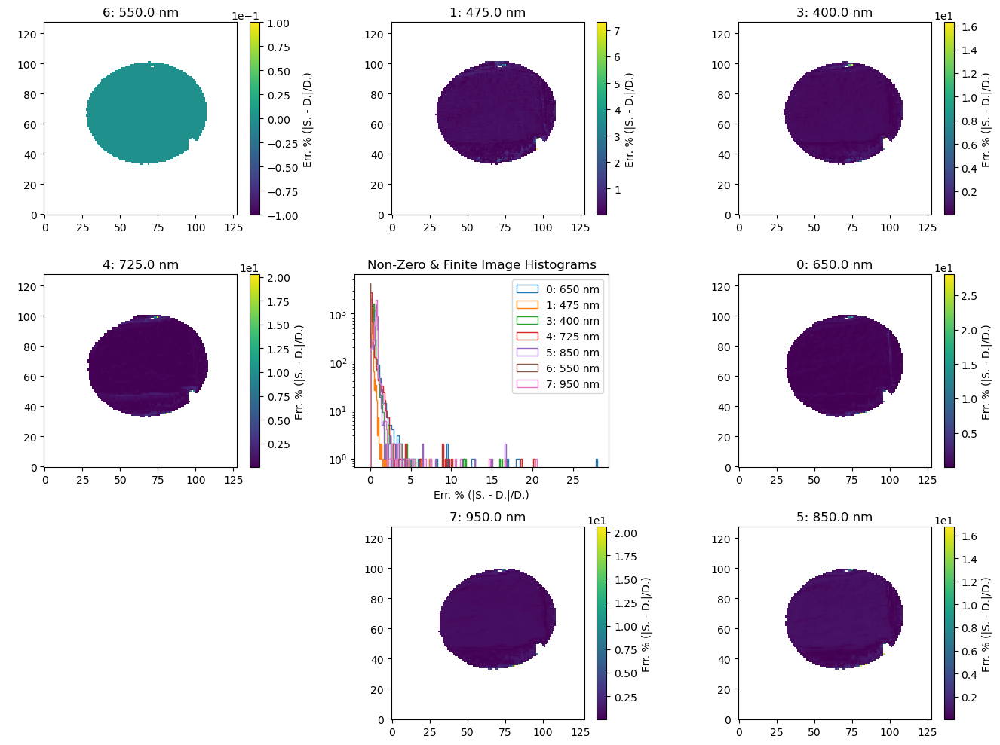

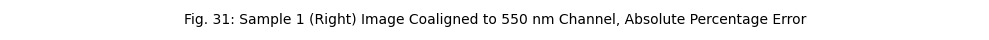

In [21]:
caption = (
    f'Fig. {30}: Sample 1 (Right) Image Coaligned to 550 nm Channel, Difference Overlay',
    f'Fig. {31}: Sample 1 (Right) Image Coaligned to 550 nm Channel, Absolute Percentage Error'
)
aligned_refl = osp.apply_coalignment(reflectance, coals, caption=caption)

### Reflectance ROI Selection and Plotting

We now select the same (or at least a similar) full-area region of interest:

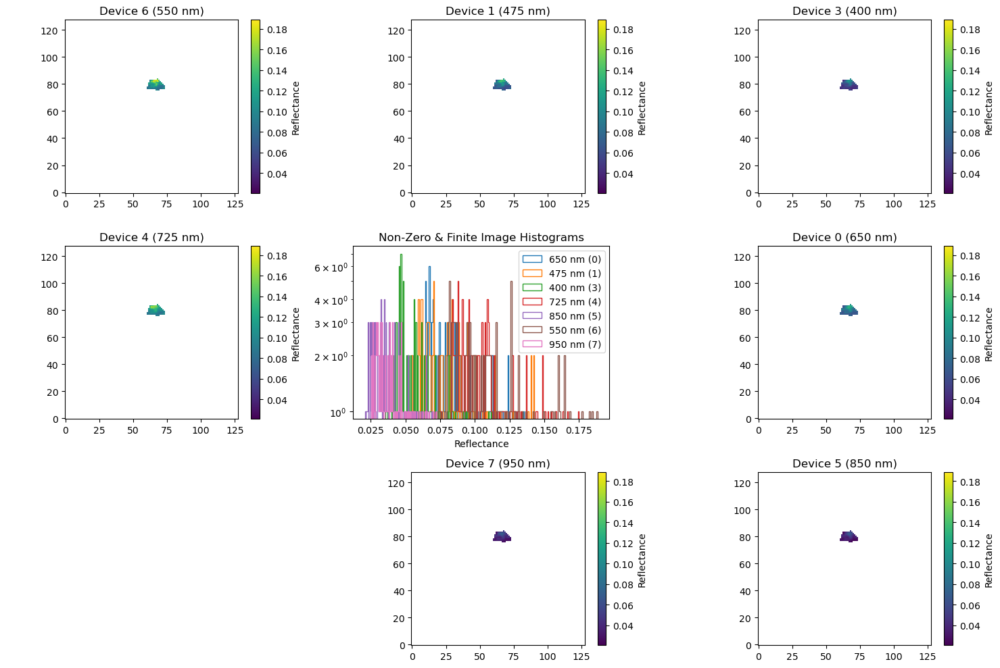

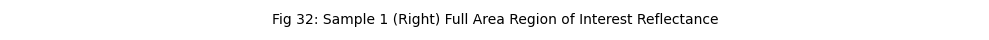

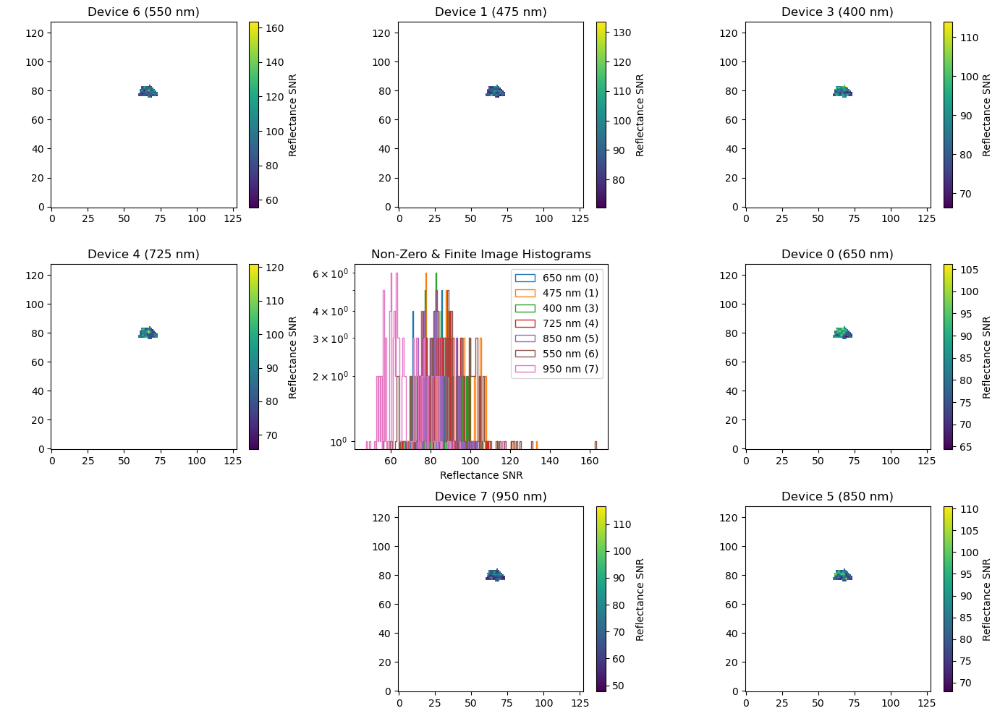

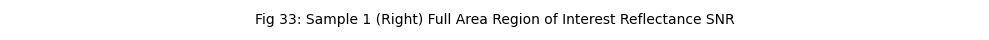

In [22]:
caption = (
    f'Fig {32}: Sample 1 (Right) Full Area Region of Interest Reflectance',
    f'Fig {33}: Sample 1 (Right) Full Area Region of Interest Reflectance SNR'
)
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550', caption=caption)

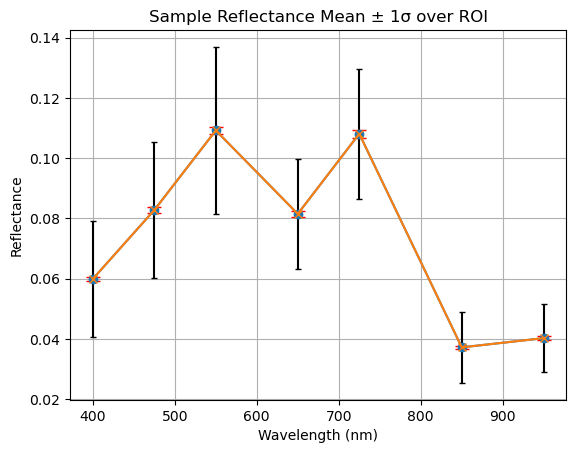

In [23]:
caption = f'Fig {34}: Sample 1 Full Area Average Region of Interest Reflectance Plot with Average Noise'
right_results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois, caption=caption)

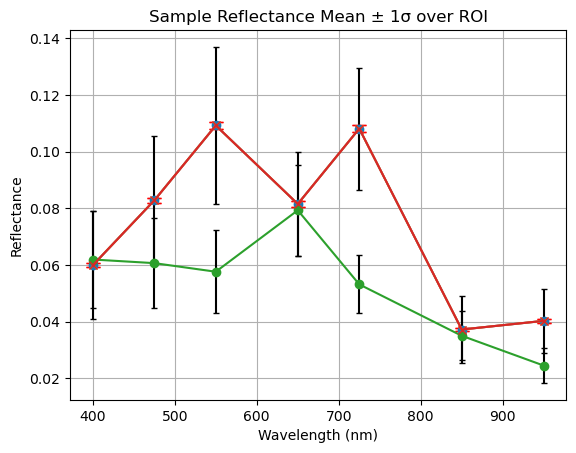

In [24]:
left_right_results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois, reference_reflectance=left_results)

Now we see that there is a very clear difference in the spectral reflectance when illuminated from the left or the right.

Again, we see large variance over the region of interest, and so we normalise:

/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:444: RuntimeWarning: invalid value encountered in divide
  self_err = self.img_std/self.img_ave
/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:446: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:446: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave


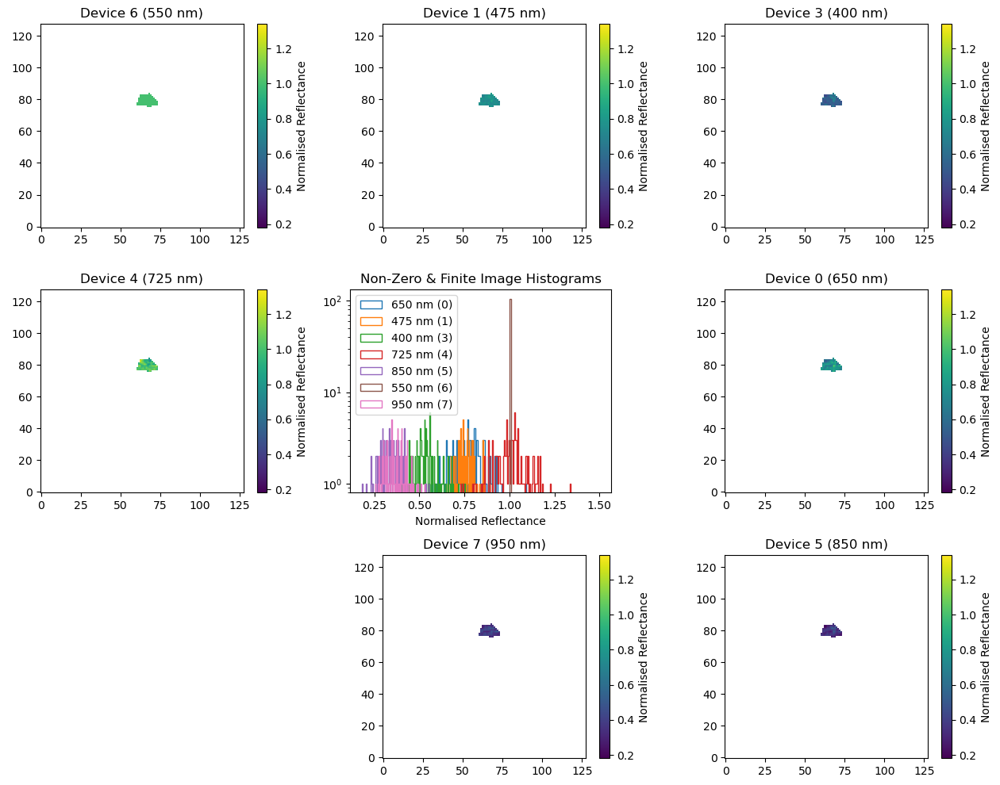

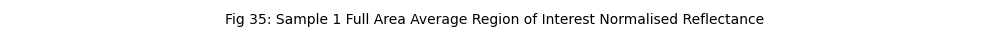

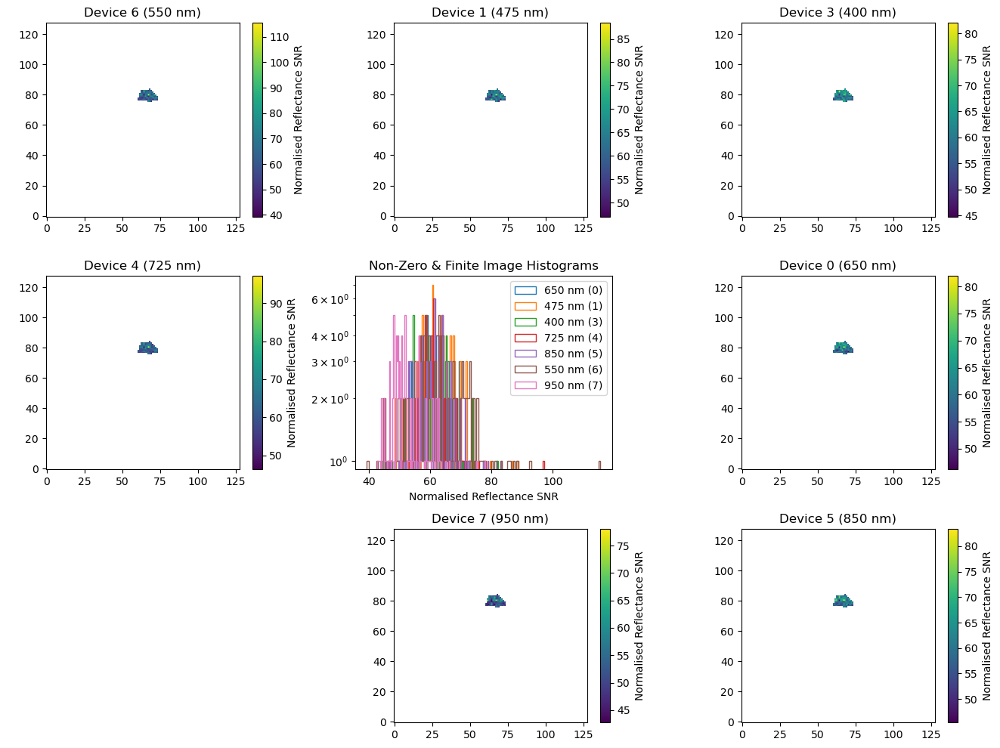

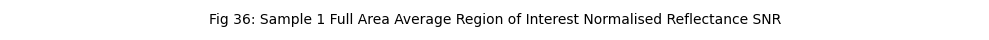

In [25]:
caption = (
    f'Fig {35}: Sample 1 Full Area Average Region of Interest Normalised Reflectance',
    f'Fig {36}: Sample 1 Full Area Average Region of Interest Normalised Reflectance SNR',
)
norm_refl = osp.normalise_reflectance(aligned_refl, caption=caption)

and we plot the normalised reflectance:

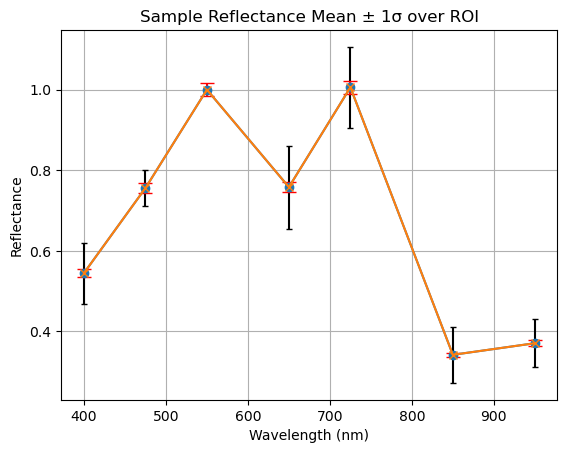

In [26]:
caption = f'Fig {37}: Sample 1 (Right) Full Area Average Region of Interest Normalised Reflectance Plot'
right_norm_results = osp.plot_roi_reflectance(refl_imgs=norm_refl, caption=caption)

Now we would like to compare the left and right reflectance curves, so we enter the left view as a 'reference reflectance':

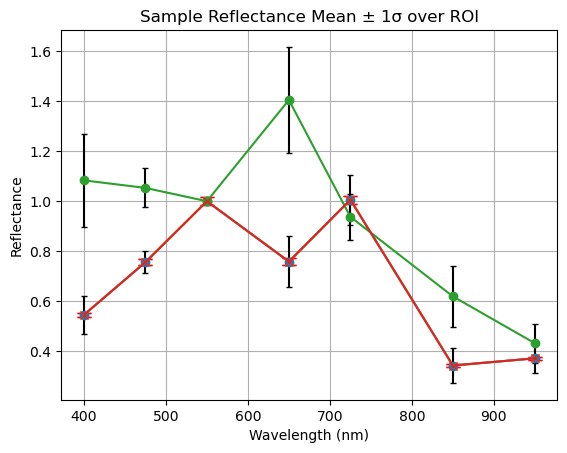

In [27]:
left_rigth_norm = osp.plot_roi_reflectance(refl_imgs=norm_refl, reference_reflectance=left_norm_results)

Normalising the result makes it clear where the strongest illumination angle dependencies lie, namely in the 650 nm channel.

We must look at using smaller regions of interest to attempt to isolate out the contributing factors.

# Sample 2

## Left

### Reflectance Calibration

Loaded images (img) for: 0 (650 nm)
Loading sample_2_r: 0 (650 nm)
Loaded images (drk) for: 0 (650 nm)
Subtracting dark frame for: 0 (650 nm)


/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:218: RuntimeWarning: divide by zero encountered in divide
  np.divide(img_ave, img_std, out=out, where=img_ave!=0)


Loaded images (img) for: 1 (475 nm)
Loading sample_2_r: 1 (475 nm)
Loaded images (drk) for: 1 (475 nm)
Subtracting dark frame for: 1 (475 nm)
Loaded images (img) for: 3 (400 nm)
Loading sample_2_r: 3 (400 nm)
Loaded images (drk) for: 3 (400 nm)
Subtracting dark frame for: 3 (400 nm)
Loaded images (img) for: 4 (725 nm)
Loading sample_2_r: 4 (725 nm)
Loaded images (drk) for: 4 (725 nm)
Subtracting dark frame for: 4 (725 nm)
Loaded images (img) for: 5 (850 nm)
Loading sample_2_r: 5 (850 nm)
Loaded images (drk) for: 5 (850 nm)
Subtracting dark frame for: 5 (850 nm)
Loaded images (img) for: 6 (550 nm)
Loading sample_2_r: 6 (550 nm)
Loaded images (drk) for: 6 (550 nm)
Subtracting dark frame for: 6 (550 nm)
Loaded images (img) for: 7 (950 nm)
Loading sample_2_r: 7 (950 nm)
Loaded images (drk) for: 7 (950 nm)
Subtracting dark frame for: 7 (950 nm)


/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:436: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave


../data/sample_2_r/0_650
Mean image written to ../data/sample_2_r/0_650/650_mean_rfl.tif
Error image written to ../data/sample_2_r/0_650/650_error_rfl.tif
../data/sample_2_r/1_475
Mean image written to ../data/sample_2_r/1_475/475_mean_rfl.tif
Error image written to ../data/sample_2_r/1_475/475_error_rfl.tif
../data/sample_2_r/3_400
Mean image written to ../data/sample_2_r/3_400/400_mean_rfl.tif
Error image written to ../data/sample_2_r/3_400/400_error_rfl.tif
../data/sample_2_r/4_725
Mean image written to ../data/sample_2_r/4_725/725_mean_rfl.tif
Error image written to ../data/sample_2_r/4_725/725_error_rfl.tif
../data/sample_2_r/5_850
Mean image written to ../data/sample_2_r/5_850/850_mean_rfl.tif
Error image written to ../data/sample_2_r/5_850/850_error_rfl.tif
../data/sample_2_r/6_550
Mean image written to ../data/sample_2_r/6_550/550_mean_rfl.tif
Error image written to ../data/sample_2_r/6_550/550_error_rfl.tif
../data/sample_2_r/7_950
Mean image written to ../data/sample_2_r/7_95

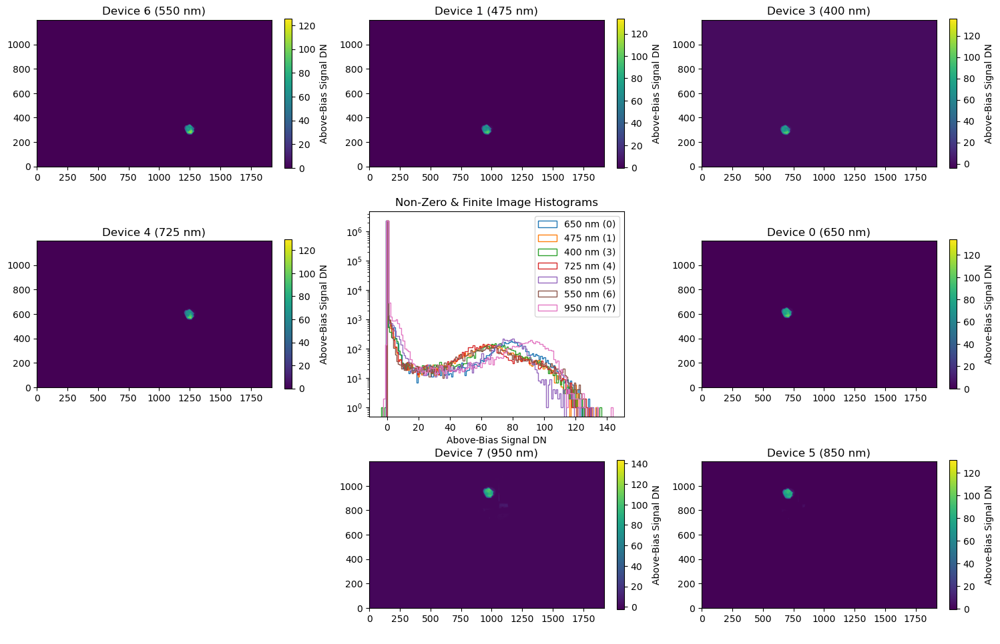

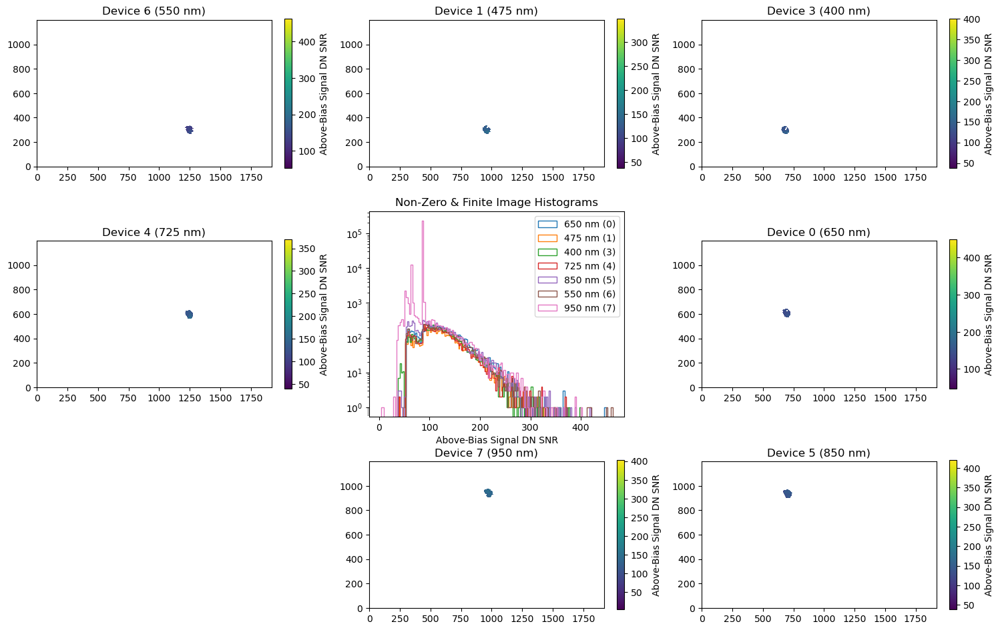

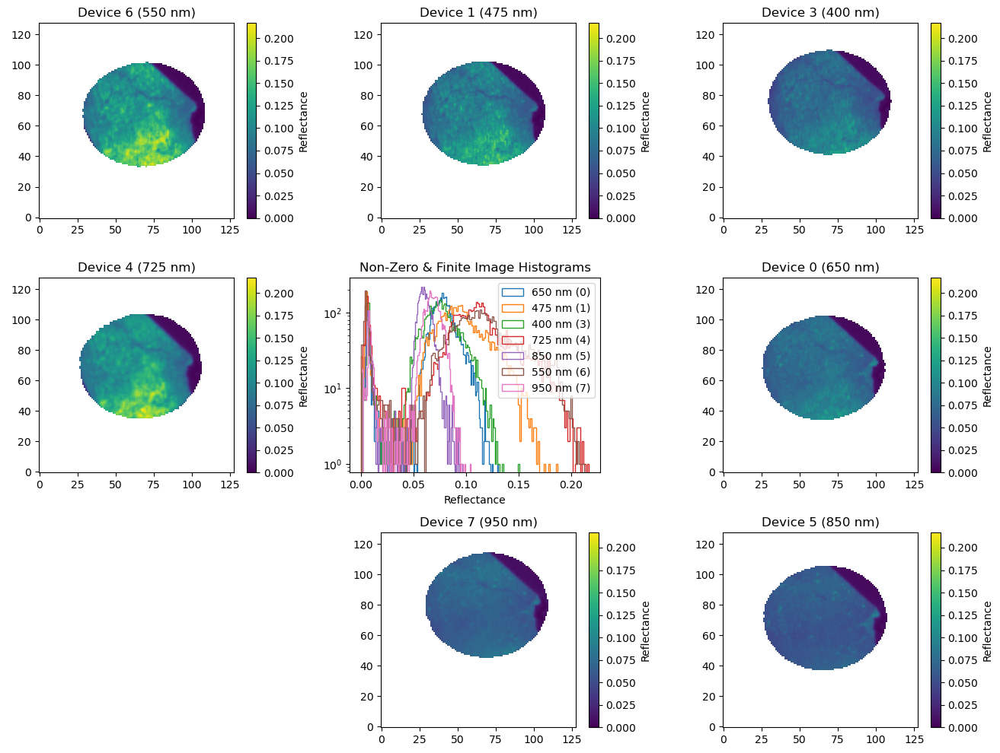

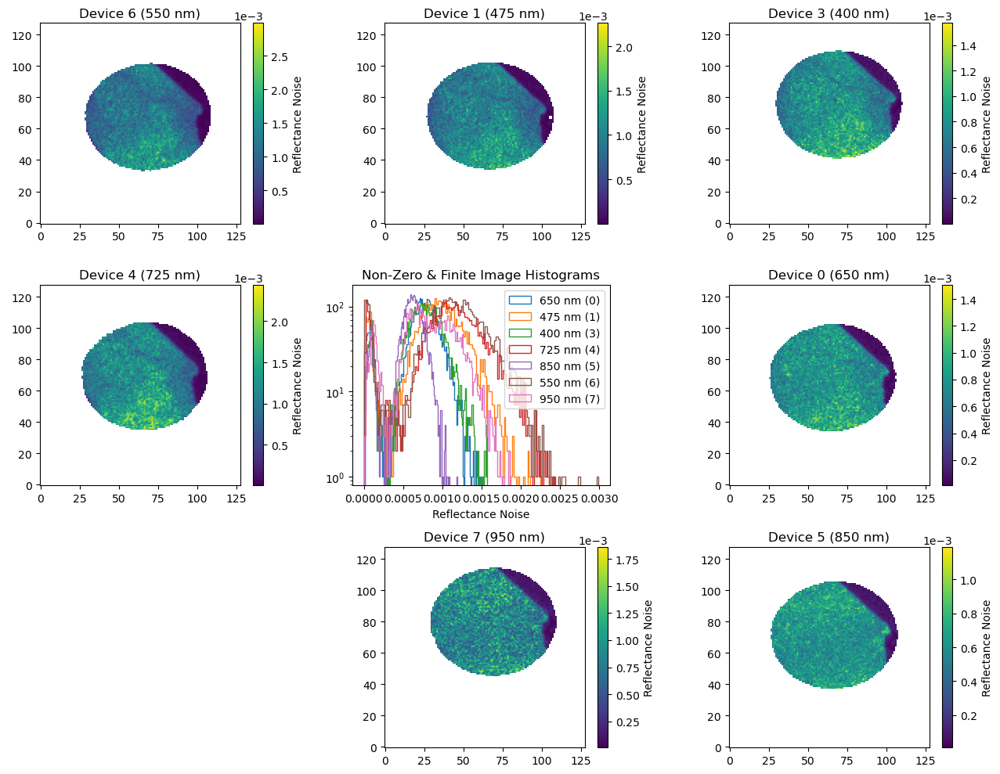

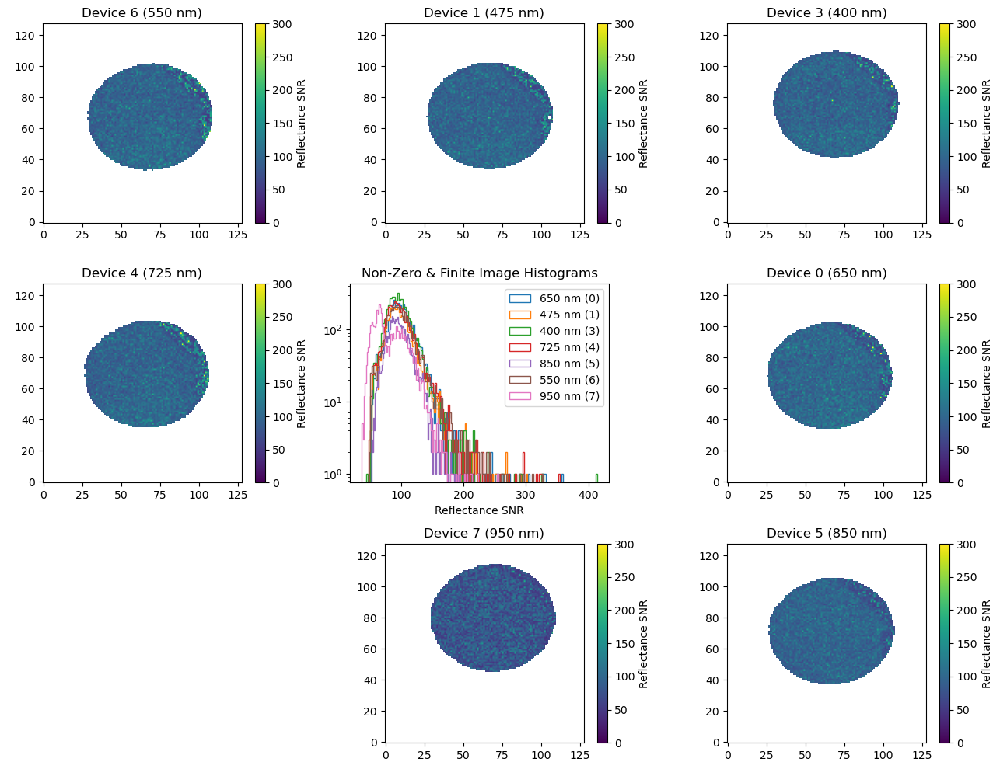

In [28]:
smpl_imgs = osp.load_sample('sample_2_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

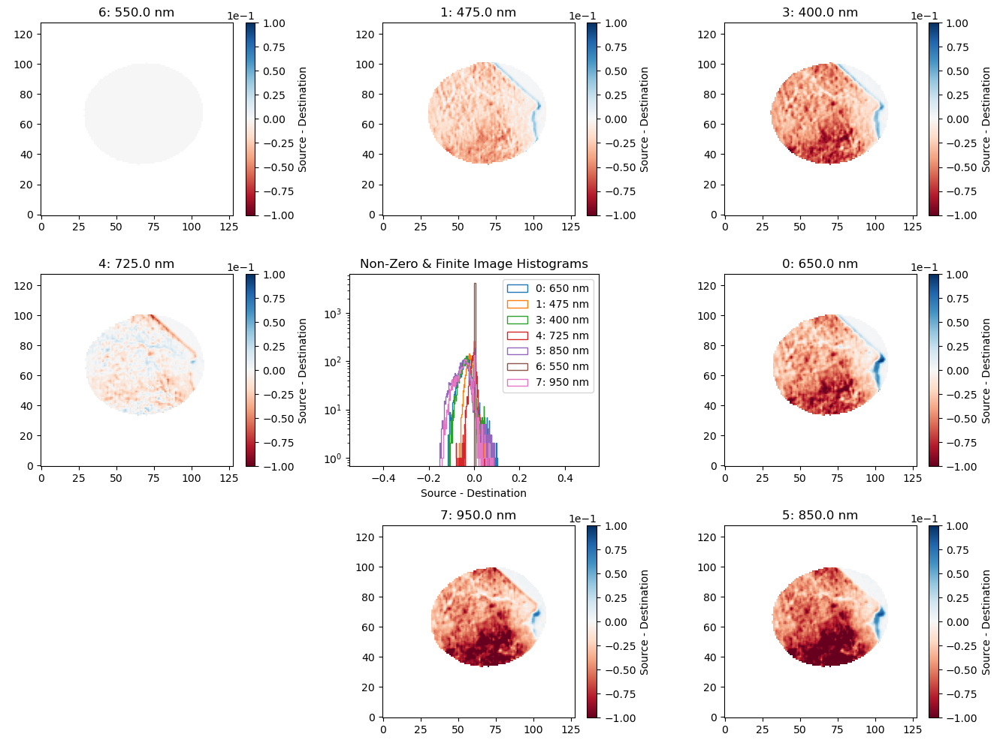

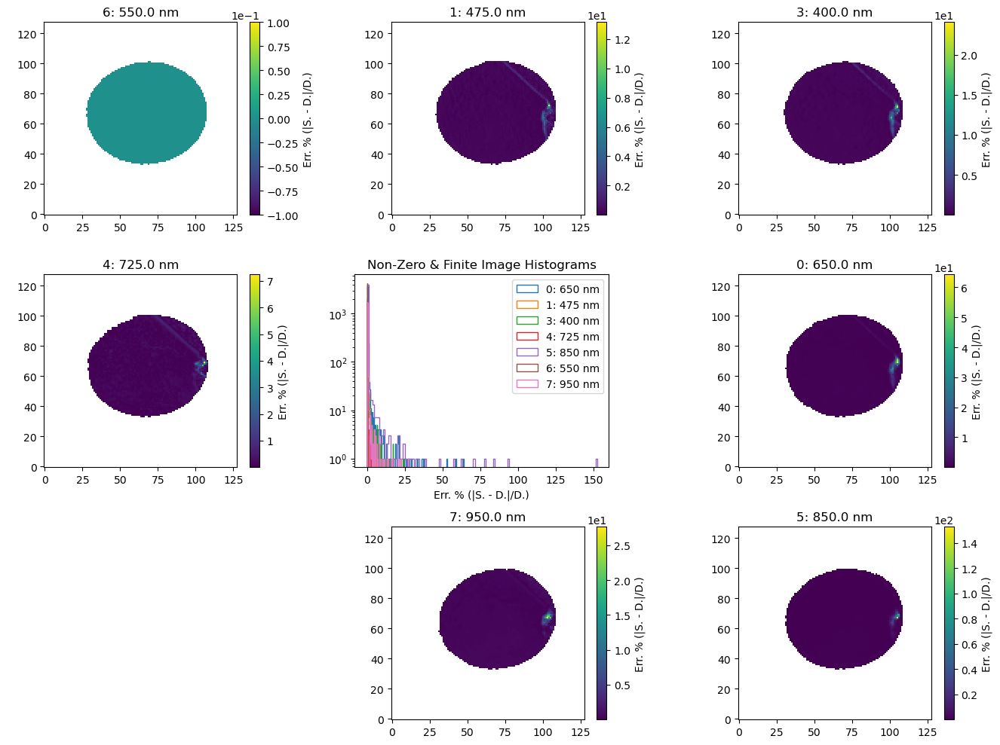

In [29]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

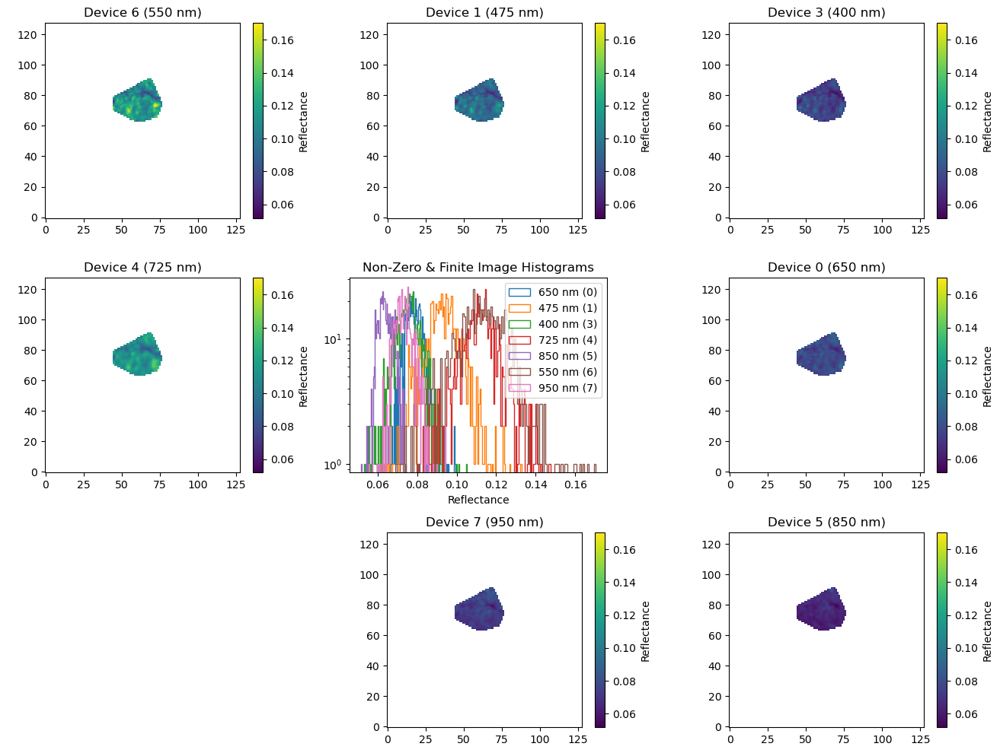

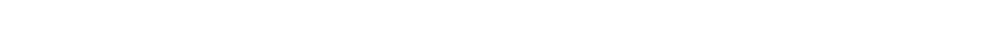

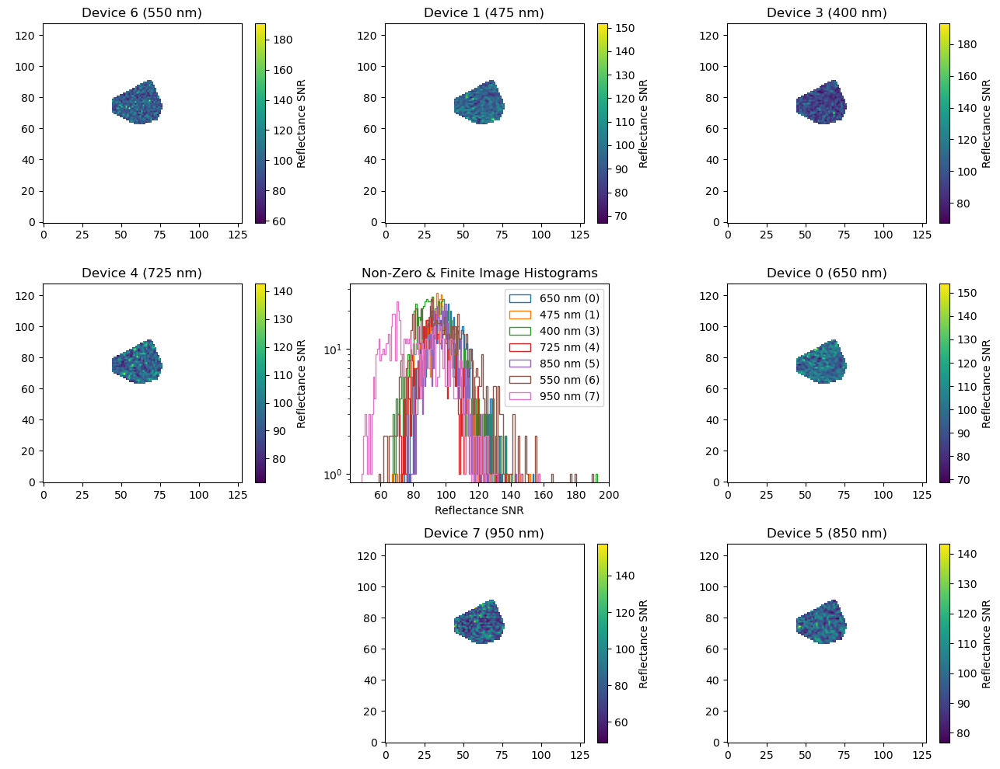

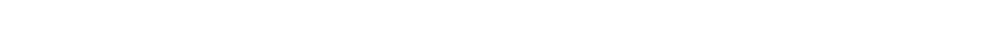

In [30]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

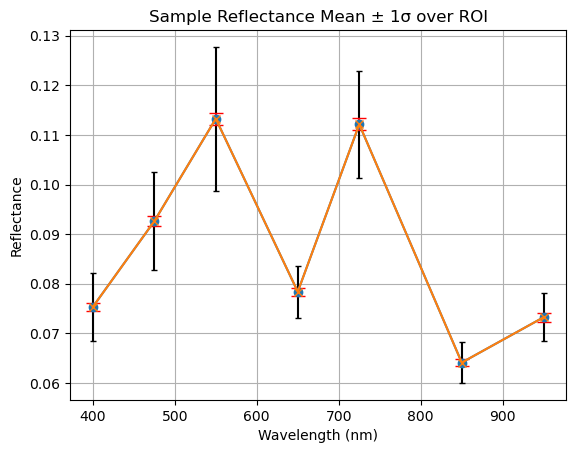

In [31]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:444: RuntimeWarning: invalid value encountered in divide
  self_err = self.img_std/self.img_ave


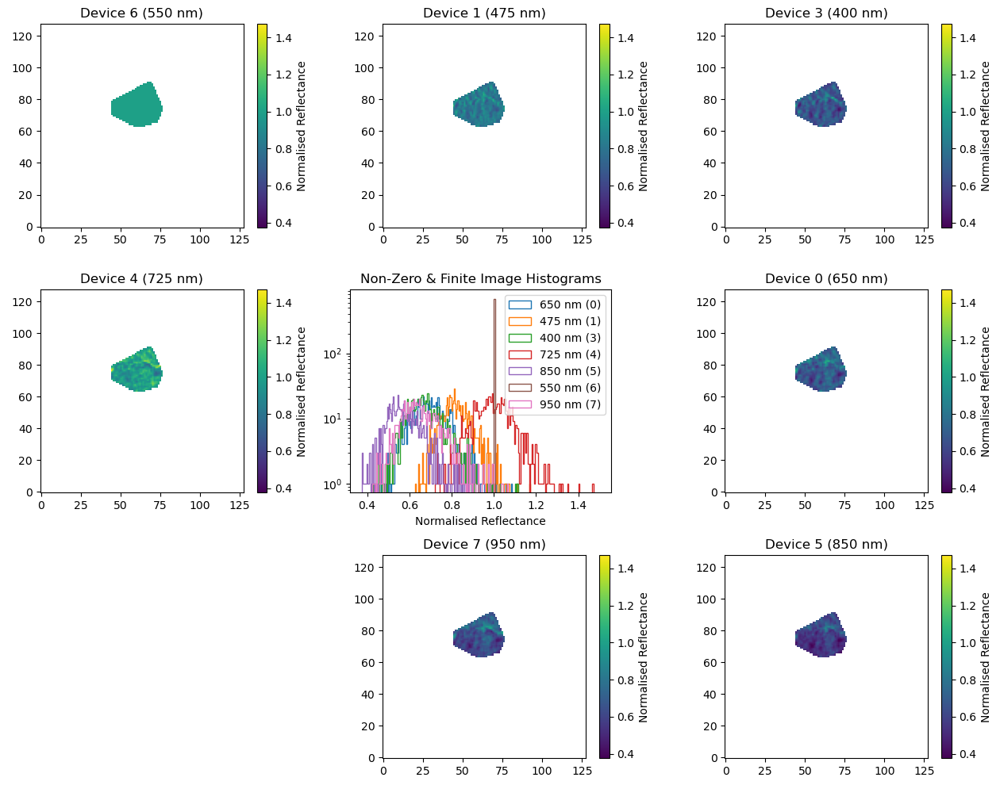

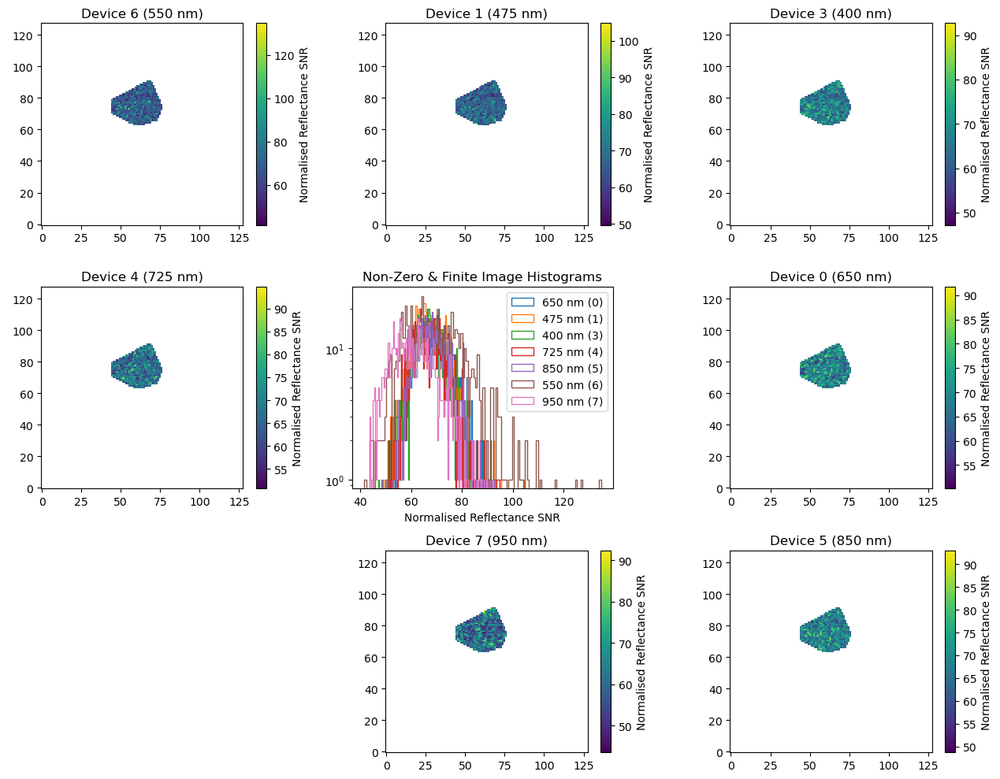

In [32]:
norm_refl = osp.normalise_reflectance(aligned_refl)

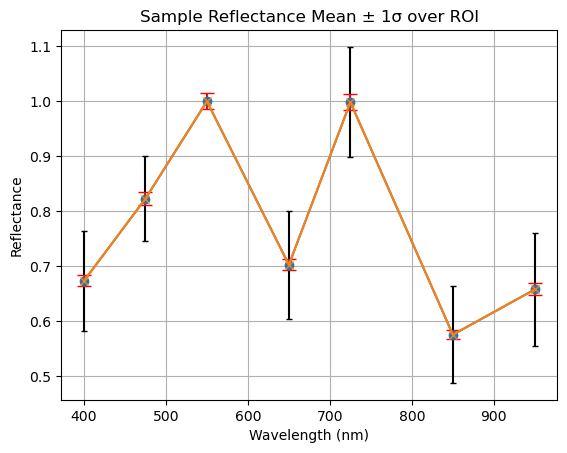

In [33]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

## Right

### Reflectance Calibration

Loaded images (img) for: 0 (650 nm)
Loading sample_2_r: 0 (650 nm)
Loaded images (drk) for: 0 (650 nm)
Subtracting dark frame for: 0 (650 nm)


/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:218: RuntimeWarning: divide by zero encountered in divide
  np.divide(img_ave, img_std, out=out, where=img_ave!=0)


Loaded images (img) for: 1 (475 nm)
Loading sample_2_r: 1 (475 nm)
Loaded images (drk) for: 1 (475 nm)
Subtracting dark frame for: 1 (475 nm)
Loaded images (img) for: 3 (400 nm)
Loading sample_2_r: 3 (400 nm)
Loaded images (drk) for: 3 (400 nm)
Subtracting dark frame for: 3 (400 nm)
Loaded images (img) for: 4 (725 nm)
Loading sample_2_r: 4 (725 nm)
Loaded images (drk) for: 4 (725 nm)
Subtracting dark frame for: 4 (725 nm)
Loaded images (img) for: 5 (850 nm)
Loading sample_2_r: 5 (850 nm)
Loaded images (drk) for: 5 (850 nm)
Subtracting dark frame for: 5 (850 nm)
Loaded images (img) for: 6 (550 nm)
Loading sample_2_r: 6 (550 nm)
Loaded images (drk) for: 6 (550 nm)
Subtracting dark frame for: 6 (550 nm)
Loaded images (img) for: 7 (950 nm)
Loading sample_2_r: 7 (950 nm)
Loaded images (drk) for: 7 (950 nm)
Subtracting dark frame for: 7 (950 nm)


/Users/sci/Documents/projects/orochi_simulator_control/src/orochi_sim_proc.py:436: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave


../data/sample_2_r/0_650
Mean image written to ../data/sample_2_r/0_650/650_mean_rfl.tif
Error image written to ../data/sample_2_r/0_650/650_error_rfl.tif
../data/sample_2_r/1_475
Mean image written to ../data/sample_2_r/1_475/475_mean_rfl.tif
Error image written to ../data/sample_2_r/1_475/475_error_rfl.tif
../data/sample_2_r/3_400
Mean image written to ../data/sample_2_r/3_400/400_mean_rfl.tif
Error image written to ../data/sample_2_r/3_400/400_error_rfl.tif
../data/sample_2_r/4_725
Mean image written to ../data/sample_2_r/4_725/725_mean_rfl.tif
Error image written to ../data/sample_2_r/4_725/725_error_rfl.tif
../data/sample_2_r/5_850
Mean image written to ../data/sample_2_r/5_850/850_mean_rfl.tif
Error image written to ../data/sample_2_r/5_850/850_error_rfl.tif
../data/sample_2_r/6_550
Mean image written to ../data/sample_2_r/6_550/550_mean_rfl.tif
Error image written to ../data/sample_2_r/6_550/550_error_rfl.tif
../data/sample_2_r/7_950
Mean image written to ../data/sample_2_r/7_95

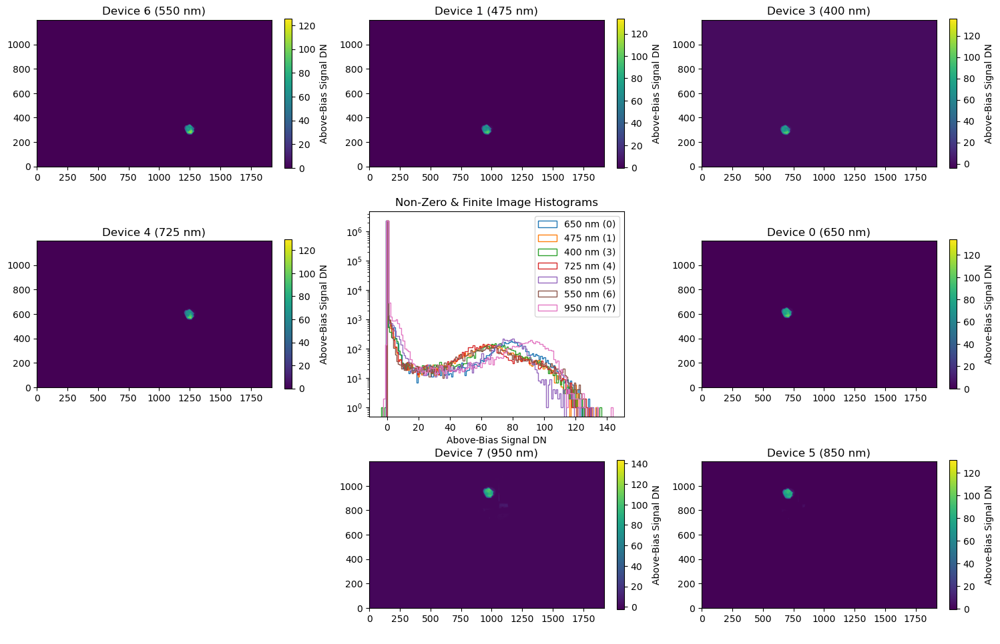

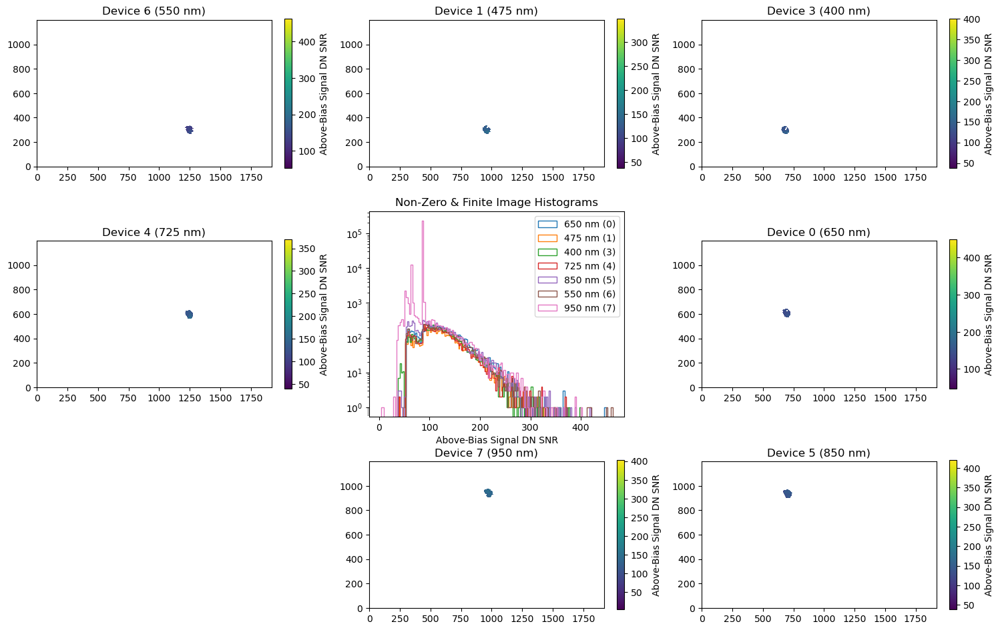

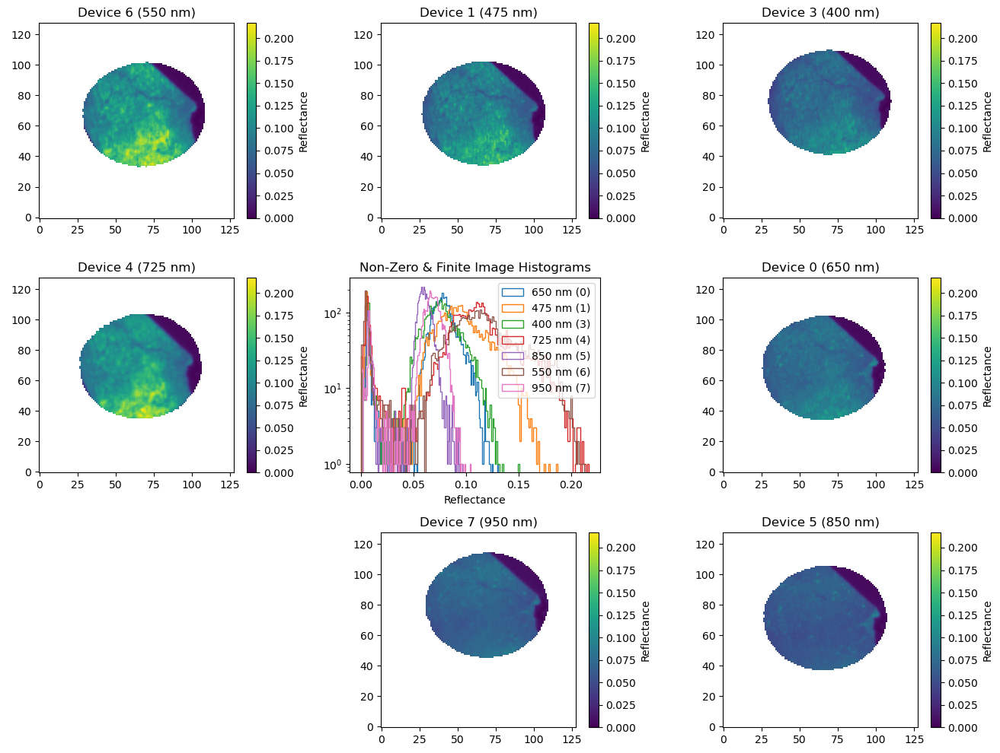

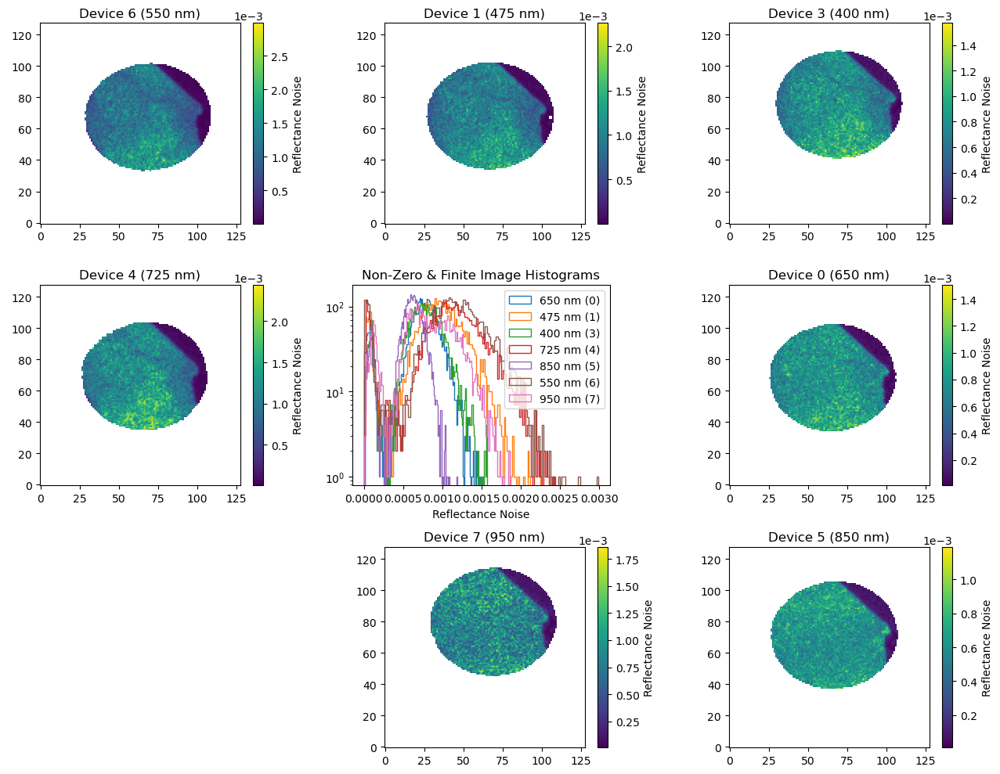

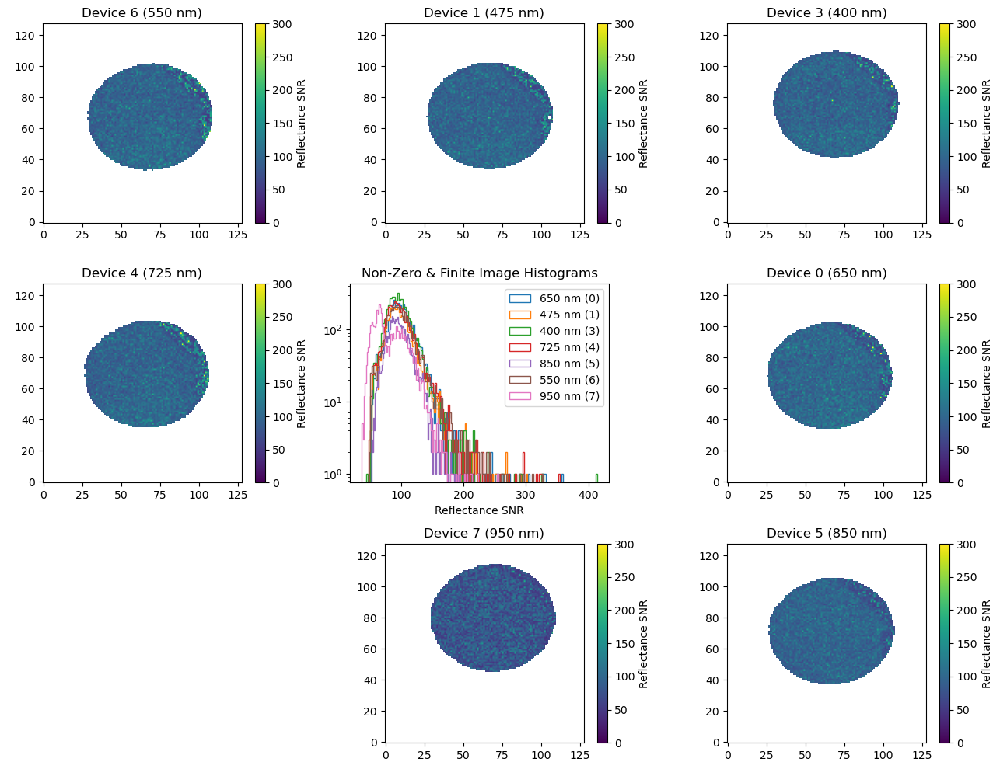

In [34]:
smpl_imgs = osp.load_sample('sample_2_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

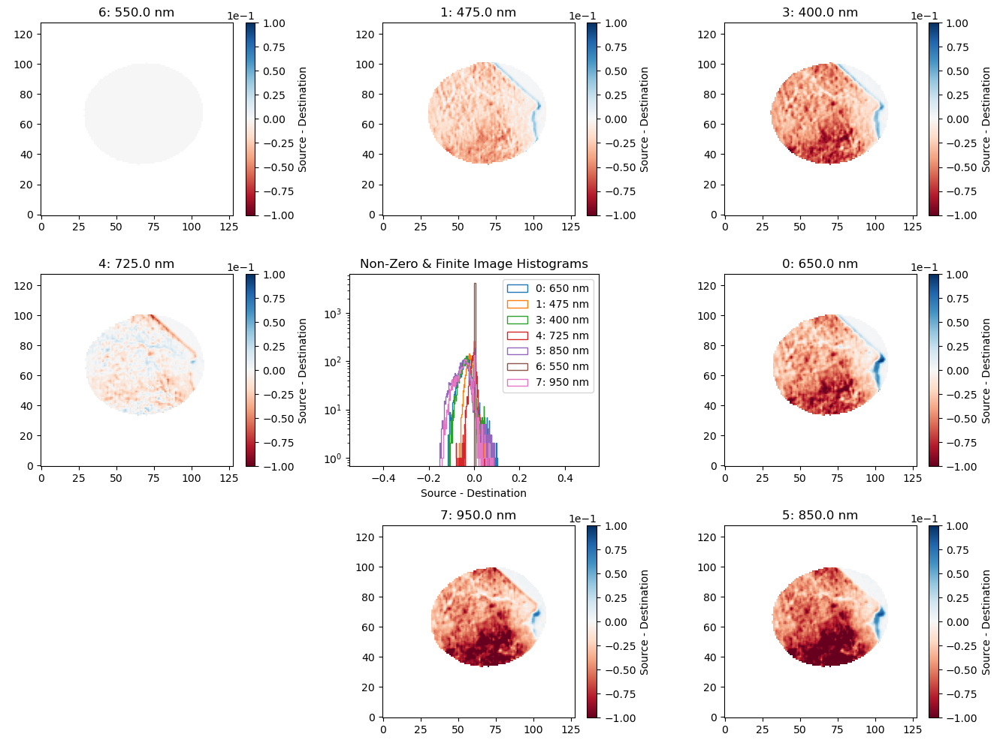

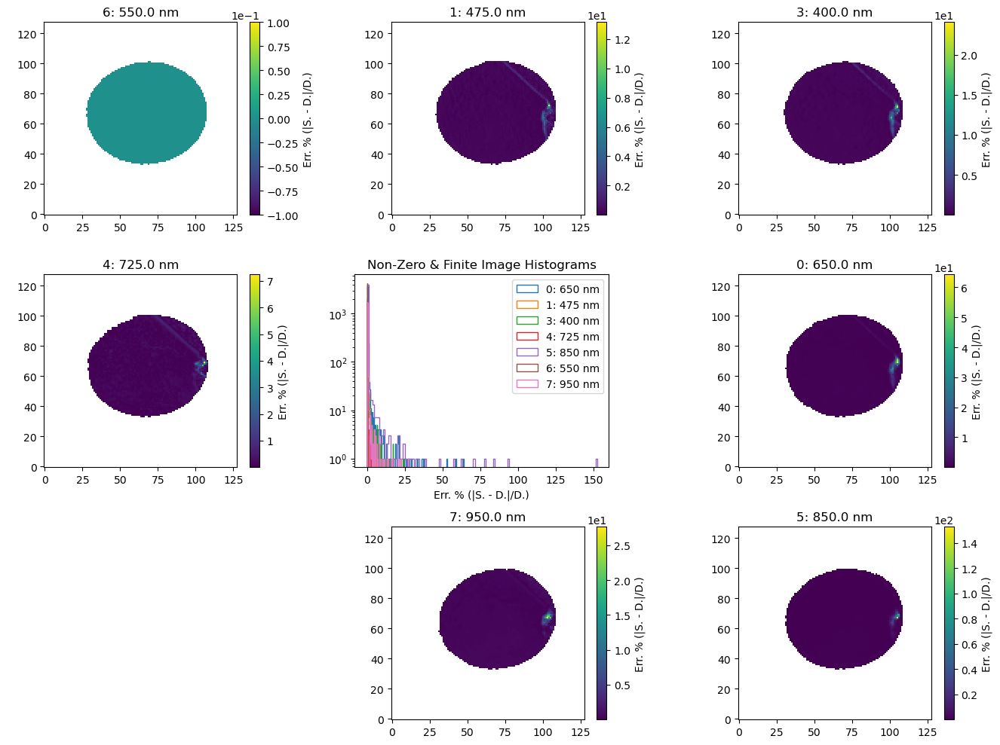

In [35]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

In [36]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

IndexError: list index out of range

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

In [ ]:
norm_refl = osp.normalise_reflectance(aligned_refl)

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

# Sample 3

## Left

### Reflectance Calibration

In [ ]:
smpl_imgs = osp.load_sample('sample_3_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

In [ ]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

In [ ]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

In [ ]:
norm_refl = osp.normalise_reflectance(aligned_refl)

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

## Right

### Reflectance Calibration

In [ ]:
smpl_imgs = osp.load_sample('sample_3_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

In [ ]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

In [ ]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

In [ ]:
norm_refl = osp.normalise_reflectance(aligned_refl)

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

# Sample 4

## Left

### Reflectance Calibration

In [ ]:
smpl_imgs = osp.load_sample('sample_4_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

In [ ]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

In [ ]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

In [ ]:
norm_refl = osp.normalise_reflectance(aligned_refl)

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

## Right

### Reflectance Calibration

In [ ]:
smpl_imgs = osp.load_sample('sample_4_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

In [ ]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

In [ ]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

In [ ]:
norm_refl = osp.normalise_reflectance(aligned_refl)

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

# Sample 5

## Left

### Reflectance Calibration

In [ ]:
smpl_imgs = osp.load_sample('sample_5_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

In [ ]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

In [ ]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

In [ ]:
norm_refl = osp.normalise_reflectance(aligned_refl)

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

## Right

### Reflectance Calibration

In [ ]:
smpl_imgs = osp.load_sample('sample_5_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

In [ ]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

In [ ]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

In [ ]:
norm_refl = osp.normalise_reflectance(aligned_refl)

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

# Checking the Dark and Light Reflectance Calibration After Imaging

In [ ]:
cali_imgs = osp.load_reflectance_calibration('reflectance_calibration')
cali_coeffs = osp.calibrate_reflectance(cali_imgs)

# Sample Reflectance Calibration and Coalignment
- Load, average and bias correct Sample images
- Correct for exposure
- Apply calibration coefficient frames
- Optional: mask for Calibration Target area and Sample area.
- Save reflectance images

# Validation by Repeat Imaging of the Spectralon 99% Target

We now check the pipeline for reflectance calibration by processing a repeat set of images of the spectralon 99% reflectance calibration target.

Note that these images were captured after an afternoons sequence of imaging, so there is a considerable time difference between the capture of the calibration images and the validation images.

Originally this was performed on the 5% reflectance target, however therre was an issue with th dark frame exposure times for that iamge set, so here we use repeat images of the spectralon target instead. Note, the placement of the target had been radnomly reoriented on the sample area mounting plate, and so we expect spatial pattern inherent to the calibration to be amplified, rather than cancelled here.

First we load the images:

In [ ]:
smpl_imgs = osp.load_sample('reflectance_calibration_2', roi=True)

We see that the images appear very similar to those captured in the first round during calibration.

In [ ]:
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

After reflectance calibration, we see that each channel has a similar well defined peak value, with approximately Gaussian distruted values above and below this.

We also see that there is a very similar uncertainty distribution for each channel, and that again the 950 nm has a bimodal distribution.

This may be due to contributions of noise from the dark signal, as we expect the 950 nm to require a longer exposure.

Lets investigate the dark frames:

In [ ]:
osp.load_dark_frames('reflectance_calibration_2', roi=True)

Indeed we find that the 950 nm channel alone exhibits non-zero dark signal nonuniformity, due to the longer exposure time.

This has a deeper implication - that the video offset is not sufficient to raise the dark signal above the camera floor - rather it appears that once a threshold exposure time is reached, only then will the dark signal reveal itself.

However, for the time being we accept this increase in noise, and continue to process the reflectance.

Next we attempt image coalignment:

In [ ]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

Here we see that there is very low coalignment error, as anticipated for an approximately spatially uniform target.

However, we do see the imprint of the spatial pattern of the illumination over the sample area. This simply implies that the pattern may change from channel to channel, which is indeed what we oberseved when first loading in the target images (recall ring structure in the 400 nm channel).

We now plot the reflectance of a manually selected Region of Interest:

In [ ]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

Now we plot these results, in comparison to the expectation, that we retrieve:

In [ ]:
reference_reflectance = osp.get_reference_reflectance(cali_coeffs)

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois, reference_reflectance=reference_reflectance)

We actually find that there is a significant (greater than the error bars) offset between the observed values and the expected reflectance values.

This is still less than 3% error. However, we would expect this to be a closer value.

In [ ]:
norm_refl = osp.normalise_reflectance(aligned_refl)

Normalisng the reference reflectance:

In [ ]:
reference_reflectance.reference = reference_reflectance.reference / reference_reflectance.reference['6_550']

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl, reference_reflectance=reference_reflectance)

In conclusion, we can see that there is some discrepency between the observed and expected reflectance values, that we should investigate the cause of.

The first investigation will be to simply recollect the data, by first collecting calibration images, and then immediately collecting a second set, with the target reoriented, and then collecting tertiary sets to accompany each instance of imaging, as 'witness' plates.

## Checking against the 5% Spectralon Calibration Target - ERROR - Bad Exposures - need to repeat measurements for both first and second datasets

We expect the reflectance retrieved to be near 5%, with a slight positive gradient from short to long wavelengths.
This process will verify and validate the reflectance processing pipeline.

First we load the target images and perform bias correction.

In [ ]:
smpl_imgs = osp.load_sample('dark_reflectance_calibration_2')

Note that here we repeatedly find the images to contain negative value, implying the presence of random dark signal in these low-lighting images.

This is expected to a degree because of the longer exposure times required to image the low reflectance target. Note that we also expect the sample reflectance (i.e. rocks) to have reflectance in the range of ~5%, so this test is a goo dindicator of the noise we may expect.

We can also check if this dark noise is present over the region of interest:

In [ ]:
dark_smpl_imgs = osp.load_dark_frames('dark_reflectance_calibration', roi=True)

Indeed we see that for the 400 nm and 950 nm channels, there is noise, whereas all other channels have effectively 0 dark noise.
This is likely due to the exposure times required at these wavelengths, where the camera response is lowest.
Let's check the exposure times used:

In [ ]:
osp.get_exposures(dark_smpl_imgs)

Indeed we see that the exposures for the 400 and 950 nm channels are 840 ms and 1185 ms, whereas all other channels are < 30 ms.

Verifying that the exposures match...

In [ ]:
osp.get_exposures(smpl_imgs)

PROBLEM: the dark frame exposures do not match the light frame exposures. There as been an error here in the image capture!!!

This should be checked during image load in as standard.

In [ ]:
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

In [ ]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

In [ ]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

In [ ]:
norm_refl = osp.normalise_reflectance(aligned_refl)

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

## Checking against the dark calibration target

- expect to be near 0.1, but not exactly 0.1

In [ ]:
smpl_imgs = osp.load_sample('dark_reflectance_calibration_2')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

In [ ]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

In [ ]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

In [ ]:
norm_refl = osp.normalise_reflectance(aligned_refl)

In [ ]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)